In [1]:
from AtmoBuilder import AtmoBuilder

import numpy as np
import copy

% matplotlib inline

In [2]:
ab = AtmoBuilder()

Found 16 MODTRAN files:
Pachon_MODTRAN.10.7sc
Pachon_MODTRAN.11.7sc
Pachon_MODTRAN.12.7sc
Pachon_MODTRAN.13.7sc
Pachon_MODTRAN.14.7sc
Pachon_MODTRAN.15.7sc
Pachon_MODTRAN.16.7sc
Pachon_MODTRAN.17.7sc
Pachon_MODTRAN.18.7sc
Pachon_MODTRAN.19.7sc
Pachon_MODTRAN.20.7sc
Pachon_MODTRAN.21.7sc
Pachon_MODTRAN.22.7sc
Pachon_MODTRAN.23.7sc
Pachon_MODTRAN.24.7sc
Pachon_MODTRAN.25.7sc
MODTRAN files have been read.

Read filter data from LSST software stack.
Filters: ['u', 'g', 'r', 'i', 'z', 'y4']
Read hardware data from LSST software stack.


In [3]:
ab.readAll()

# Read 988 MS stars from /Users/joachim/lsst/DarwinX86/sims_sed_library/2014.10.06/starSED/kurucz/
# Read 849 white dwarfs from /Users/joachim/lsst/DarwinX86/sims_sed_library/2014.10.06/starSED/wDs/
# Read 74 mlt stars from /Users/joachim/lsst/DarwinX86/sims_sed_library/2014.10.06/starSED/mlt/
# Generated 2520 galaxies at redshifts between 0.000000 and 3.000000
# Generated 76 quasars at redshifts between 0.000000 and 7.500000
# Generated 39 sn's at redshifts between 0.000000 and 1.200000 on days ['0', '20', '40']


In [4]:
def experimenter(comp1, comp2, name, max_obs=5.0, min_obs=0.2, airmass_obs=1.5, deltaGrey=20.0, componentBins=25, 
                 deltaGreyBins=50, regressionSed='mss'):
    range1, pnum1 = ab._componentCheck(comp1,componentBins)
    range2, pnum2 = ab._componentCheck(comp2,componentBins)
    
    subexperiments = np.array([[max_obs, max_obs],[max_obs, min_obs],[min_obs,max_obs],[min_obs,min_obs]])
    exp_atmos = []

    for exp in subexperiments:
        P = copy.deepcopy(ab.parameters)
        P[pnum1] = exp[0]
        P[pnum2] = exp[1]
        exp_atmos.append(ab.buildAtmo(P,airmass_obs))
        
    for atmo in exp_atmos:
        ab.computeAtmoFit(comp1,comp2,atmo,deltaGrey=deltaGrey, deltaGreyBins=deltaGreyBins, 
                          componentBins=componentBins, regressionSed=regressionSed,pickleString=name)
        
    return

## Components:
- [Bin Tests](#Bin_Test)
- [Experiment 1: $H_2O$ and Aerosol](#Experiment-1:-$H_2O$-and-Aerosol)
- [Experiment 2: $O_2$ and Aerosol](#Experiment-2:-$O_2$-and-Aerosol)
- [Experiment 3: $O_3$ and Aerosol](#Experiment-3:-$O_3$-and-Aerosol)
- [Experiment 4: $O_2$ and Rayleigh](#Experiment-4:-$O_2$-and-Rayleigh)
- [Experiment 5: $O_3$ and Rayleigh](#Experiment-5:-$O_3$-and-Rayleigh)
- [Experiment 6: Aerosol and Alpha](#Experiment-6:-Aerosol-and-Alpha)

## Bin Tests:

Computing nonlinear regression for O3 and Rayleigh.
Observed atmosphere parameters: [1.0, 1.0, 5.0, 5.0, 1.0, 1.7]
Observed atmosphere airmass:    1.5
Standard atmosphere parameters: [1.0, 1.0, 1.0, 1.0, 1.0, 1.7]
Standard atmosphere airmass:    1.2
Observed atmosphere parameter for O3: 5.0
Observed atmosphere parameter for Rayleigh: 5.0

Fitting for O3 between 0.20 and 5.00 in 50 bins.
Fitting for Rayleigh between 0.20 and 5.00 in 50 bins.

Non-zero deltaGrey detected.
Fitting for deltaGrey between -50.00 and 50.00 mmags in 50 bins.

Regressing 125000 parameter combinations per filter...

Calculating best fit parameters for u filter...
@pickle_results: using precomputed results from 'pickles/X15_P101050501017_O3_Rayleigh_XSTD12_DG200_DGR-5050_E5_mss_u_50dgb_50b_binTest1.pkl'
Saved LogL at best fit deltaGrey for u filter.
Saved Chi-Squared at best fit deltaGrey for u filter.
Completed u filter.

Calculating best fit parameters for g filter...
@pickle_results: using precomputed results 

AtmoBuilder.py:885: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if sedkeylist == None:
/Users/joachim/lsst/DarwinX86/anaconda/2.2.0/lib/python2.7/site-packages/matplotlib/text.py:52: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if rotation in ('horizontal', None):



Saved LogL at best fit deltaGrey for y4 filter.
Saved Chi-Squared at best fit deltaGrey for y4 filter.
Completed y4 filter.


Best fit parameters (Filter, O3, Rayleigh, deltaGrey):
u 4.12 5.00 21.43
g 4.71 5.00 19.39
r 5.00 5.00 19.39
i 5.00 5.00 19.39
z 5.00 5.00 19.39
y4 1.67 5.00 19.39


/Users/joachim/lsst/DarwinX86/anaconda/2.2.0/lib/python2.7/site-packages/matplotlib/text.py:54: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  elif rotation == 'vertical':


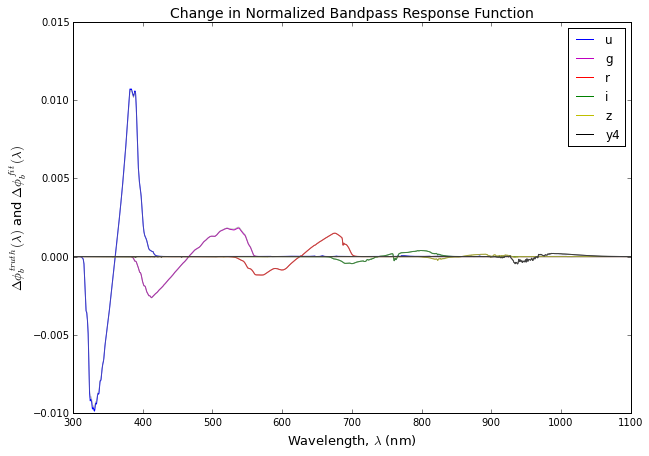

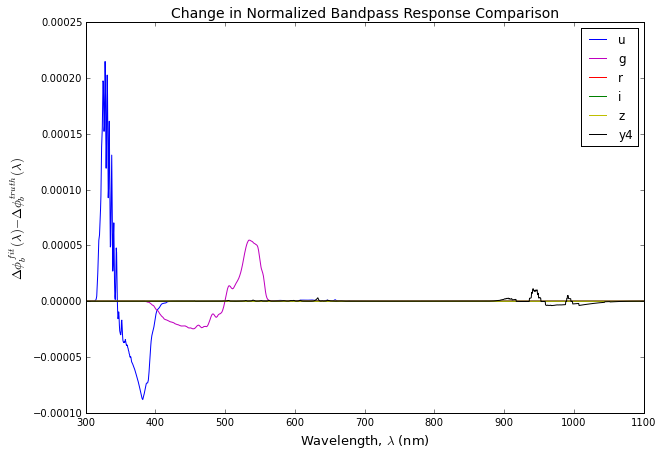

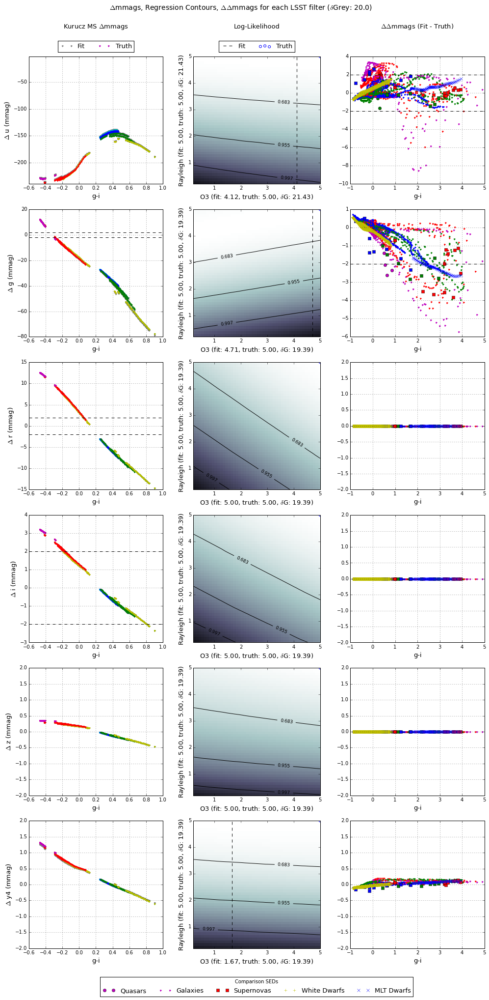

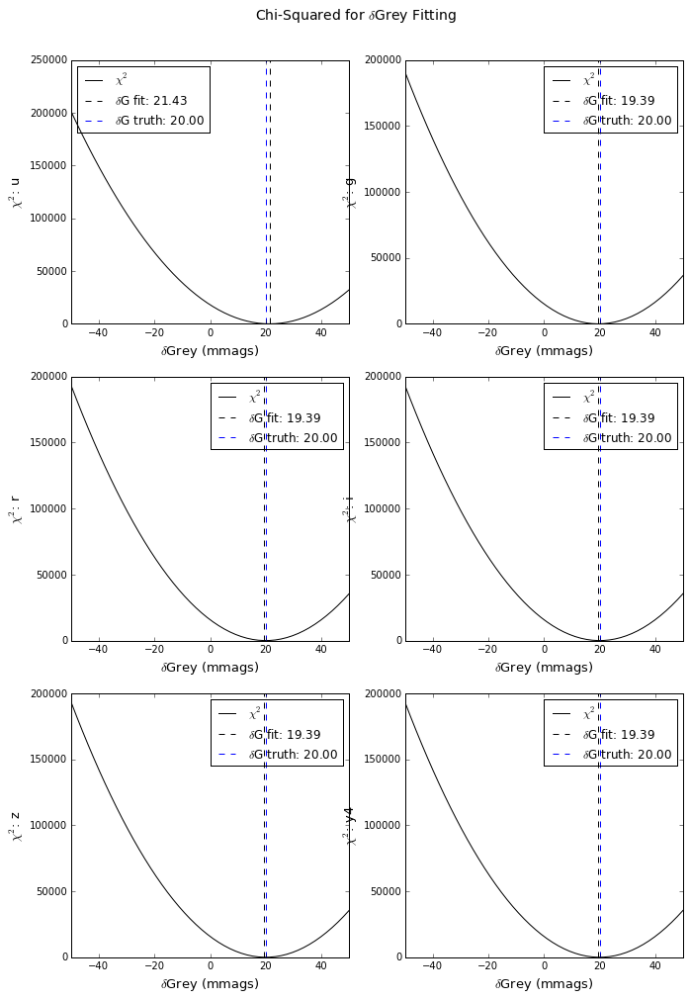

In [5]:
atmo = ab.buildAtmo([1.0,1.0,5.0,5.0,1.0,1.7], 1.5)
ab.computeAtmoFit('O3','Rayleigh',atmo, deltaGrey=20.0, componentBins=50, deltaGreyBins=50, pickleString='binTest1')

Computing nonlinear regression for O3 and Rayleigh.
Observed atmosphere parameters: [1.0, 1.0, 5.0, 5.0, 1.0, 1.7]
Observed atmosphere airmass:    1.5
Standard atmosphere parameters: [1.0, 1.0, 1.0, 1.0, 1.0, 1.7]
Standard atmosphere airmass:    1.2
Observed atmosphere parameter for O3: 5.0
Observed atmosphere parameter for Rayleigh: 5.0

Fitting for O3 between 0.20 and 5.00 in 25 bins.
Fitting for Rayleigh between 0.20 and 5.00 in 25 bins.

Non-zero deltaGrey detected.
Fitting for deltaGrey between -50.00 and 50.00 mmags in 50 bins.

Regressing 31250 parameter combinations per filter...

Calculating best fit parameters for u filter...
@pickle_results: using precomputed results from 'pickles/X15_P101050501017_O3_Rayleigh_XSTD12_DG200_DGR-5050_E5_mss_u_50dgb_25b_binTest2.pkl'
Saved LogL at best fit deltaGrey for u filter.
Saved Chi-Squared at best fit deltaGrey for u filter.
Completed u filter.

Calculating best fit parameters for g filter...
@pickle_results: using precomputed results f

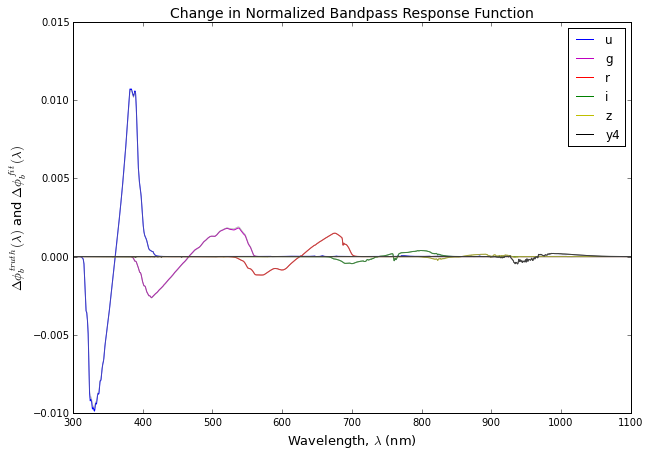

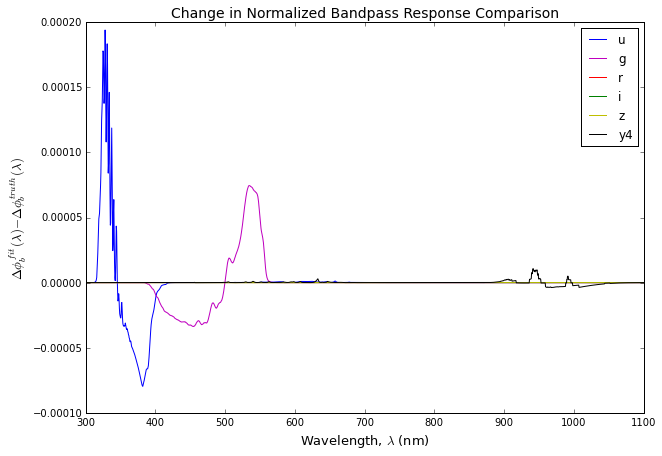

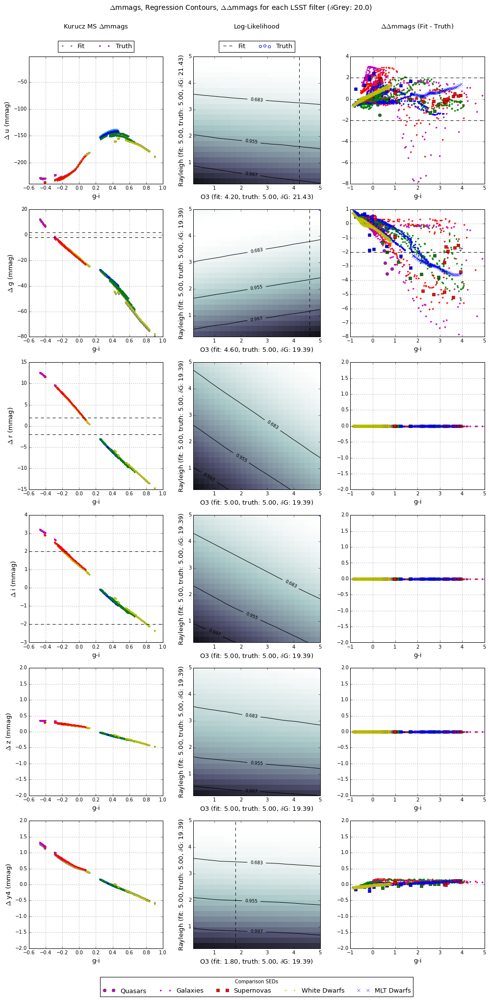

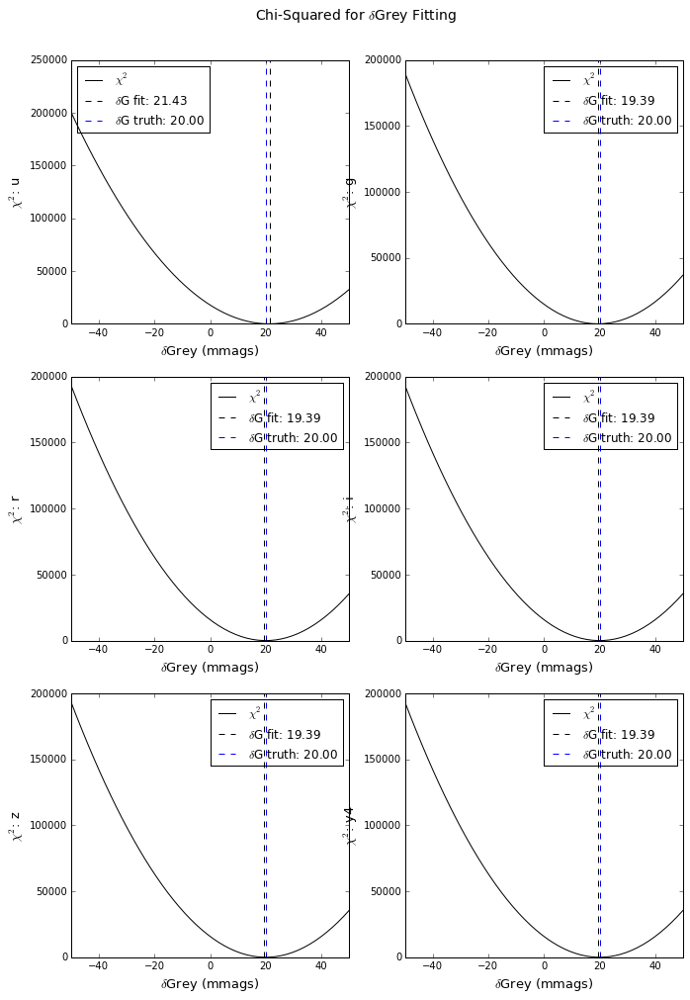

In [6]:
ab.computeAtmoFit('O3','Rayleigh',atmo, deltaGrey=20.0, componentBins=25, deltaGreyBins=50, pickleString='binTest2')

## Experiment 1: $H_2O$ and Aerosol

Computing nonlinear regression for H2O and Aerosol.
Observed atmosphere parameters: [5.0, 1.0, 1.0, 1.0, 5.0, 1.7]
Observed atmosphere airmass:    1.5
Standard atmosphere parameters: [1.0, 1.0, 1.0, 1.0, 1.0, 1.7]
Standard atmosphere airmass:    1.2
Observed atmosphere parameter for H2O: 5.0
Observed atmosphere parameter for Aerosol: 5.0

Fitting for H2O between 0.20 and 5.00 in 25 bins.
Fitting for Aerosol between 0.20 and 5.00 in 25 bins.

Non-zero deltaGrey detected.
Fitting for deltaGrey between -50.00 and 50.00 mmags in 50 bins.

Regressing 31250 parameter combinations per filter...

Calculating best fit parameters for u filter...
@pickle_results: using precomputed results from 'pickles/X15_P501010105017_H2O_Aerosol_XSTD12_DG200_DGR-5050_E5_mss_u_50dgb_25b_exp1.pkl'
Saved LogL at best fit deltaGrey for u filter.
Saved Chi-Squared at best fit deltaGrey for u filter.
Completed u filter.

Calculating best fit parameters for g filter...
@pickle_results: using precomputed results from 

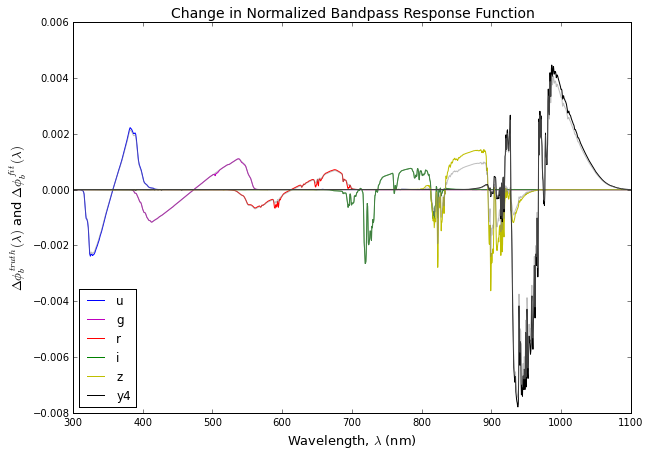

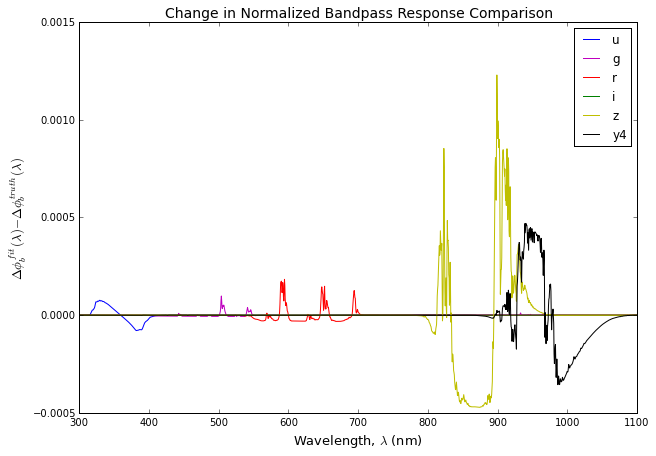

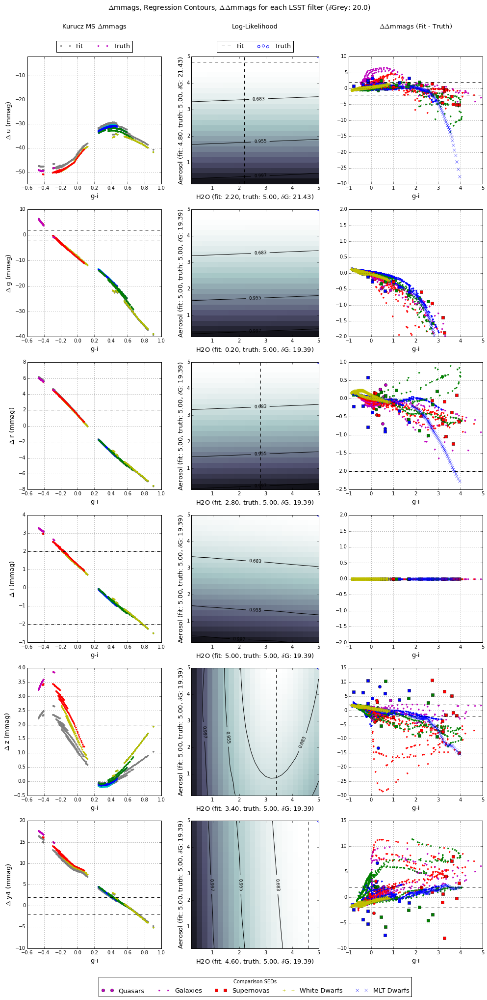

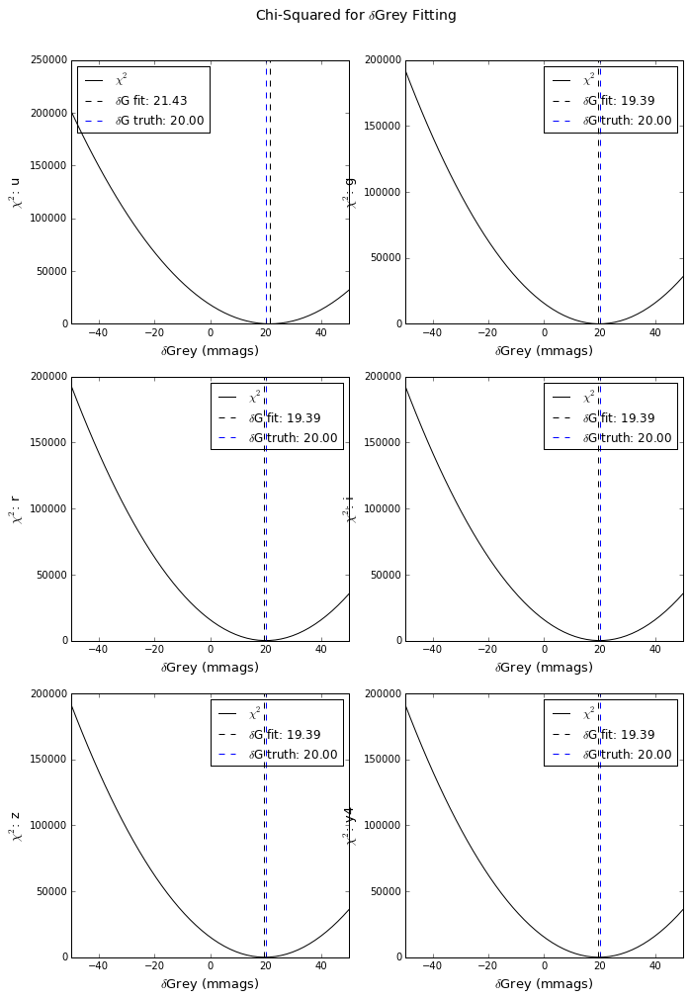

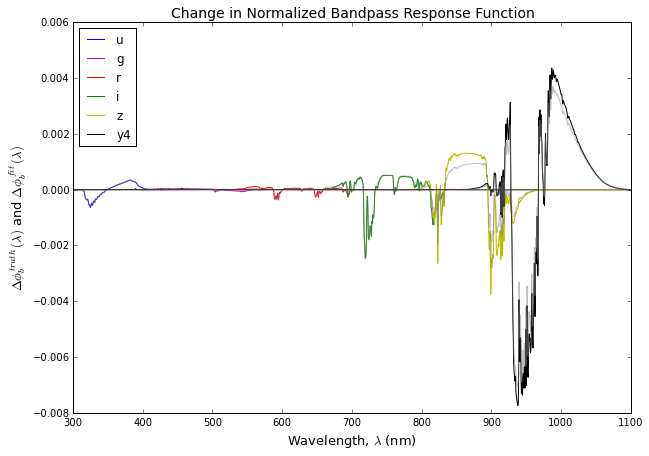

...

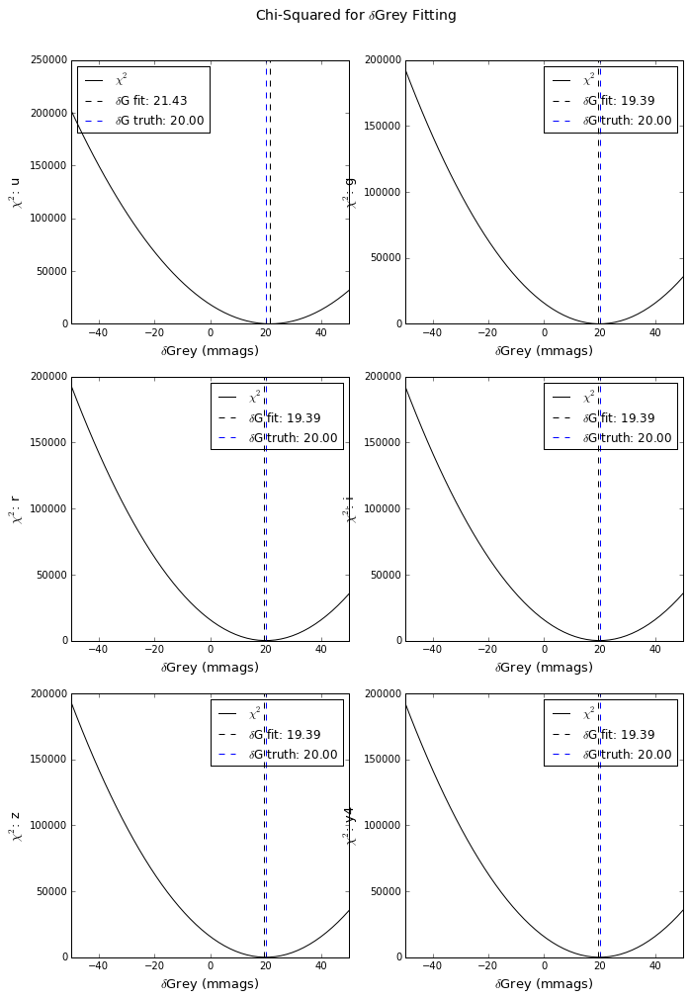

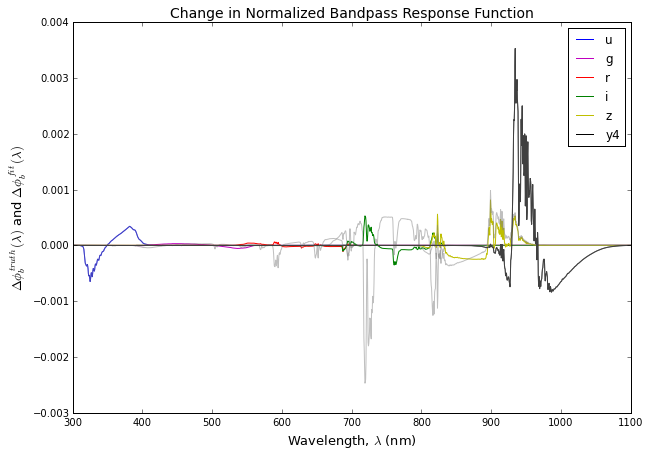

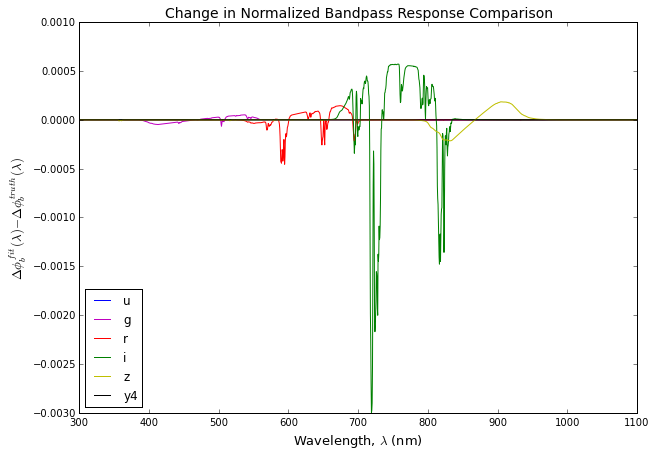

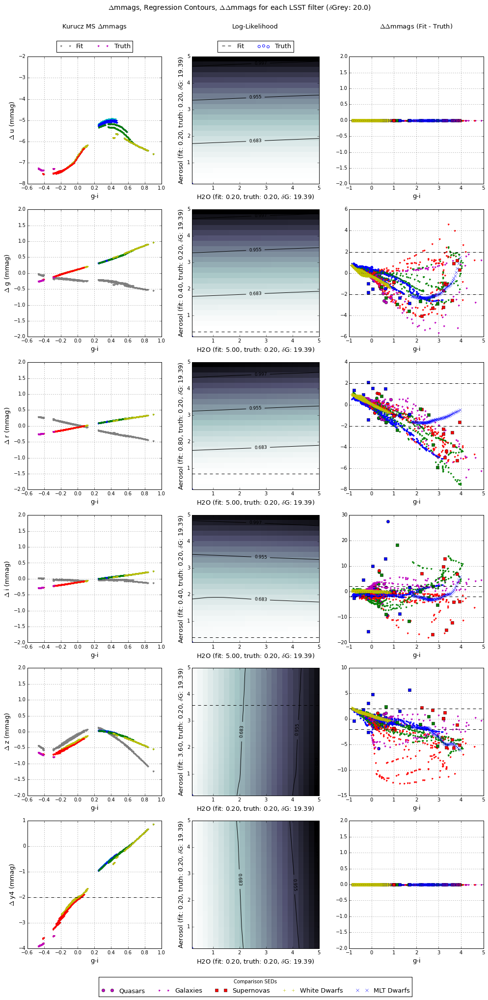

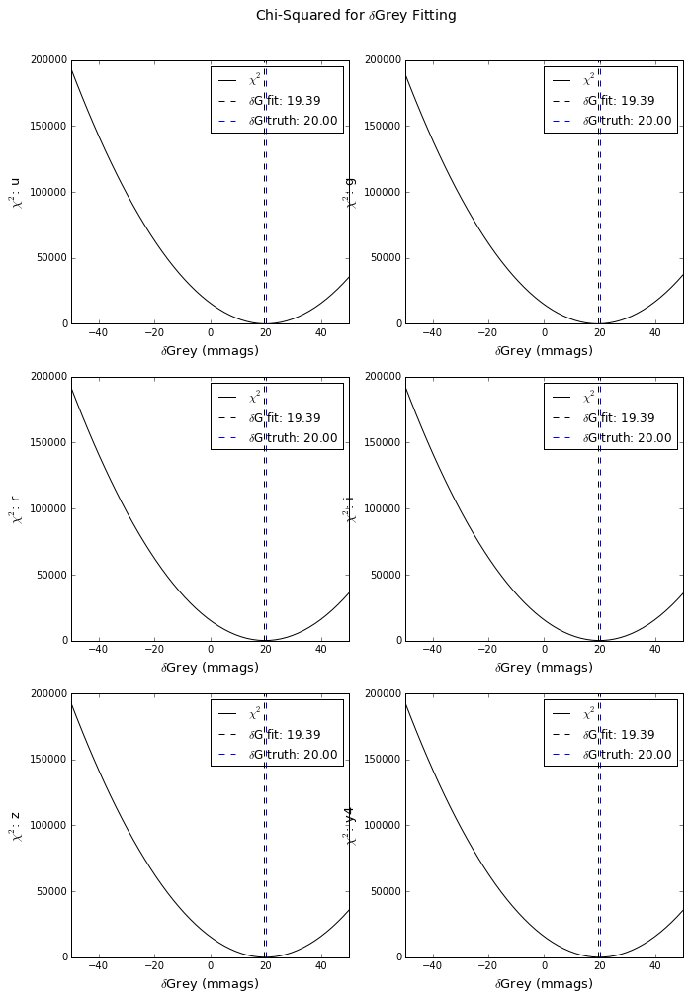

In [7]:
experimenter('H2O','Aerosol','exp1')

## Experiment 2: $O_2$ and Aerosol

Computing nonlinear regression for O2 and Aerosol.
Observed atmosphere parameters: [1.0, 5.0, 1.0, 1.0, 5.0, 1.7]
Observed atmosphere airmass:    1.5
Standard atmosphere parameters: [1.0, 1.0, 1.0, 1.0, 1.0, 1.7]
Standard atmosphere airmass:    1.2
Observed atmosphere parameter for O2: 5.0
Observed atmosphere parameter for Aerosol: 5.0

Fitting for O2 between 0.20 and 5.00 in 25 bins.
Fitting for Aerosol between 0.20 and 5.00 in 25 bins.

Non-zero deltaGrey detected.
Fitting for deltaGrey between -50.00 and 50.00 mmags in 50 bins.

Regressing 31250 parameter combinations per filter...

Calculating best fit parameters for u filter...
@pickle_results: using precomputed results from 'pickles/X15_P105010105017_O2_Aerosol_XSTD12_DG200_DGR-5050_E5_mss_u_50dgb_25b_exp2.pkl'
Saved LogL at best fit deltaGrey for u filter.
Saved Chi-Squared at best fit deltaGrey for u filter.
Completed u filter.

Calculating best fit parameters for g filter...
@pickle_results: using precomputed results from 'pic

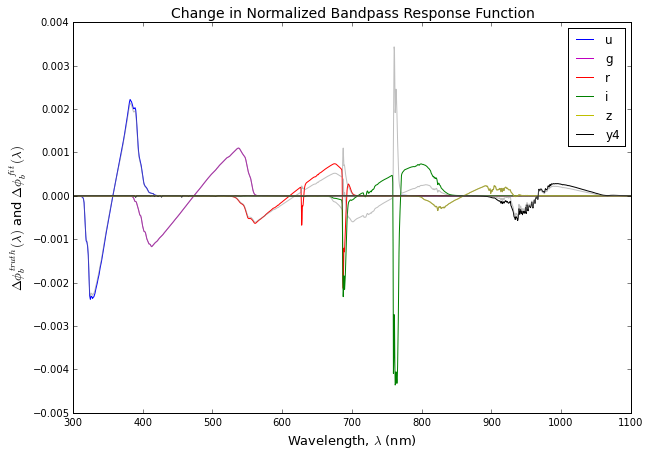

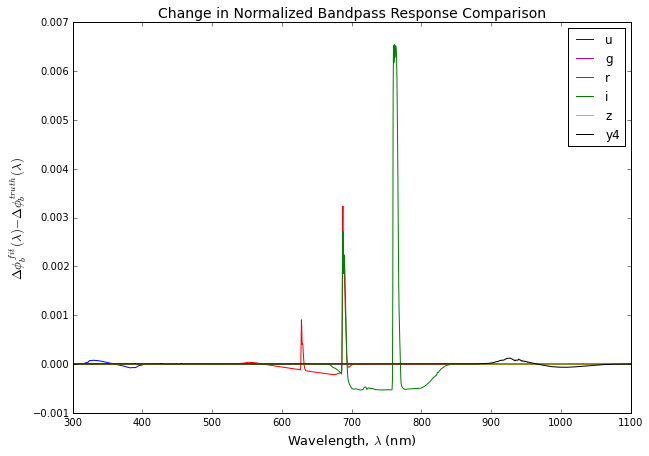

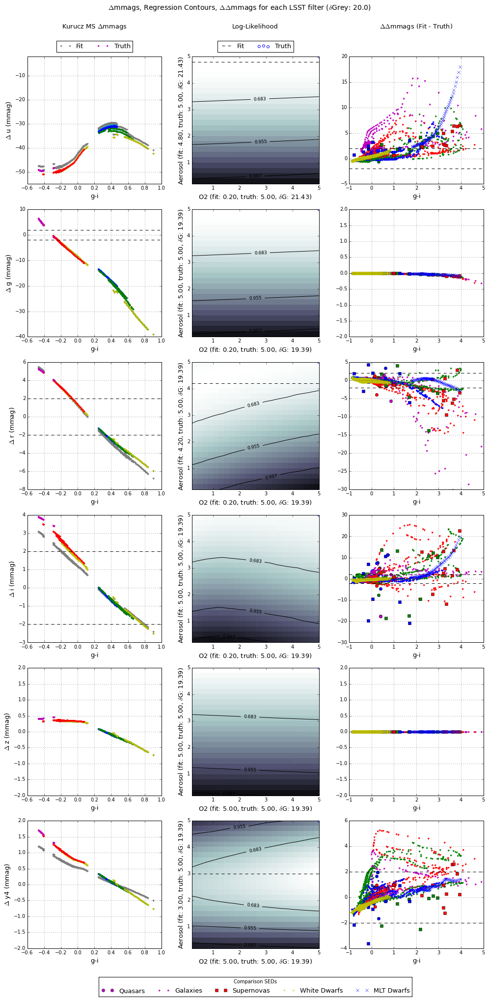

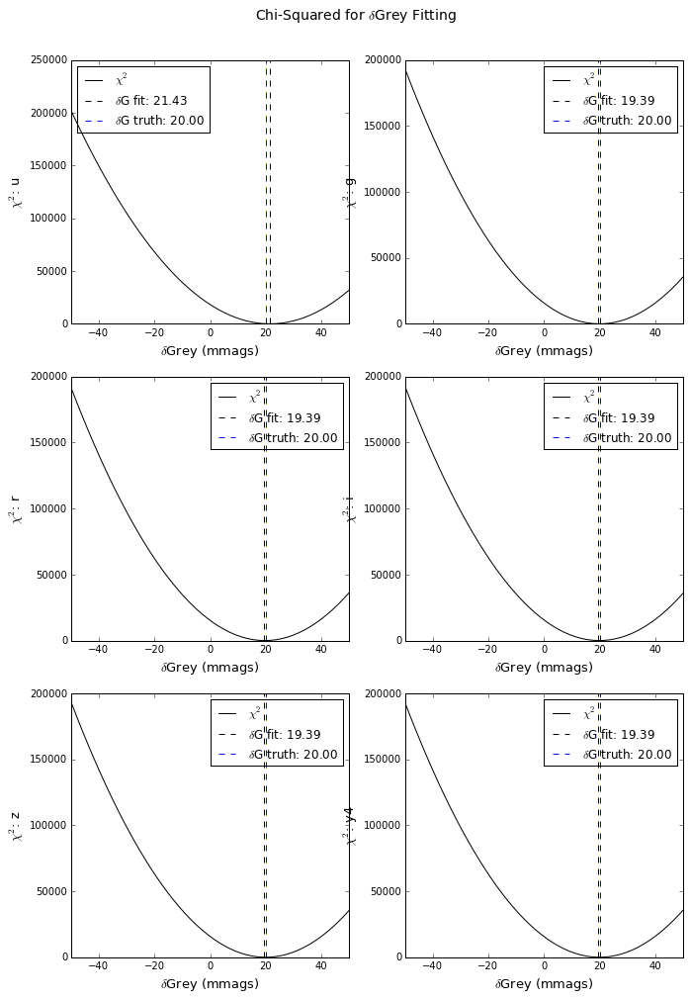

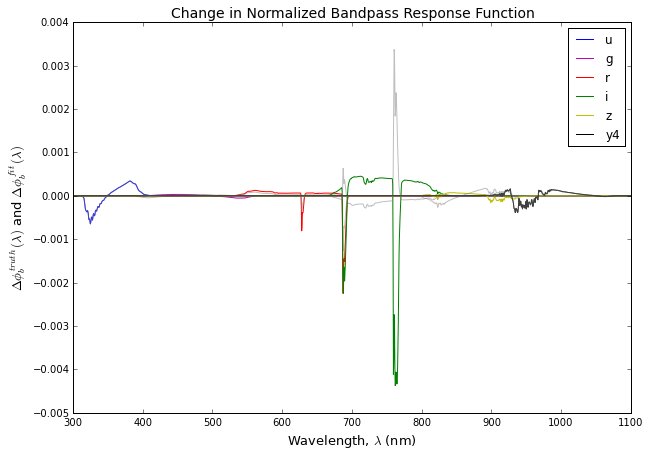

...

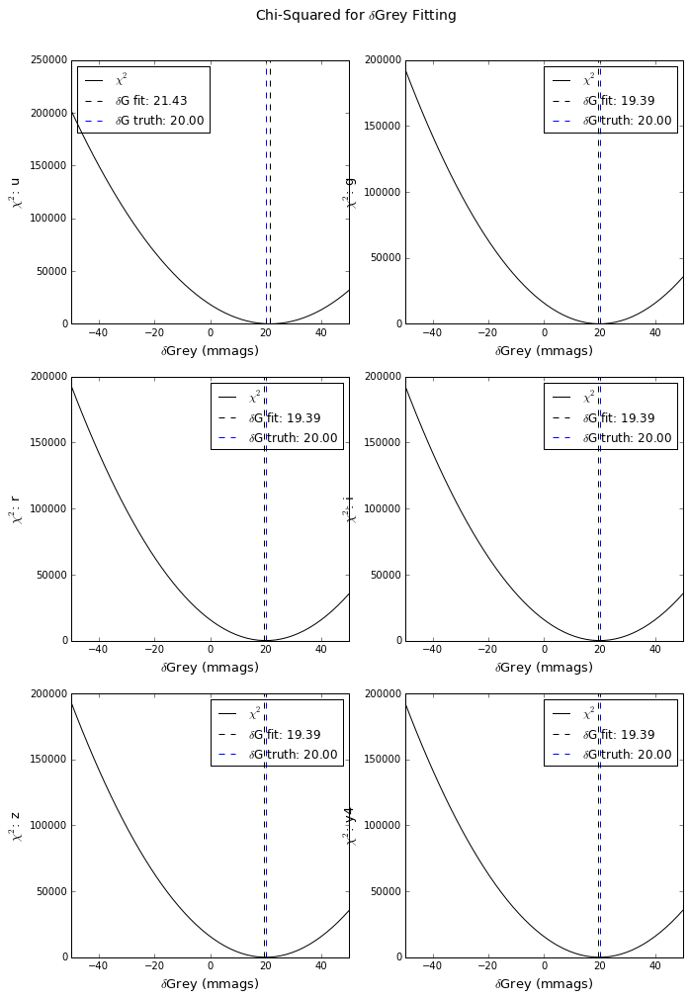

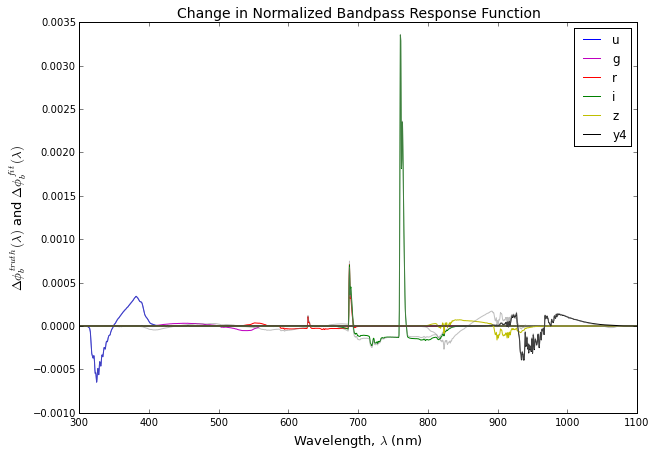

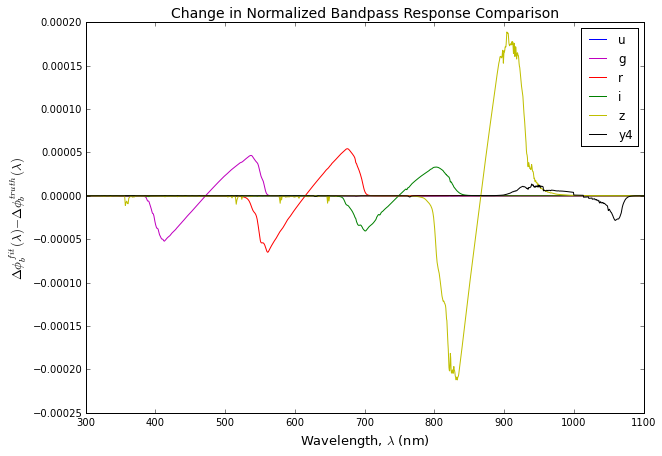

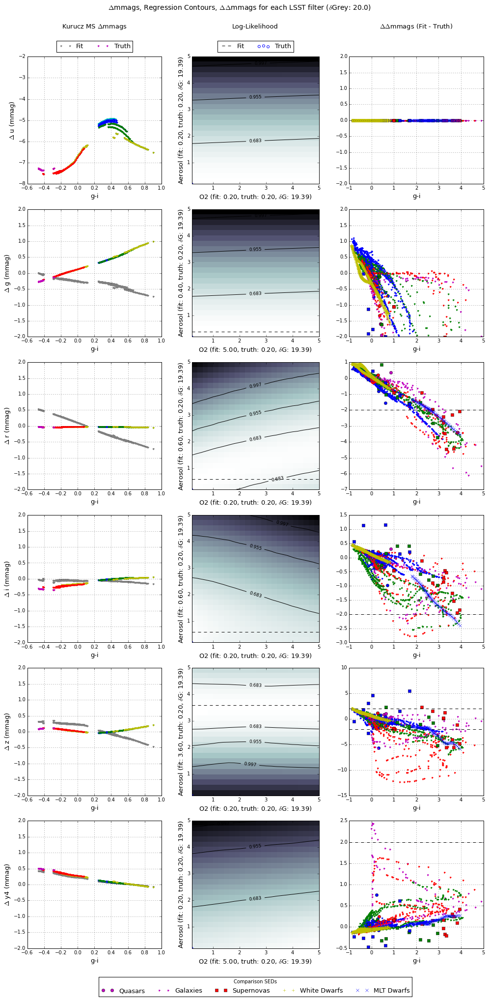

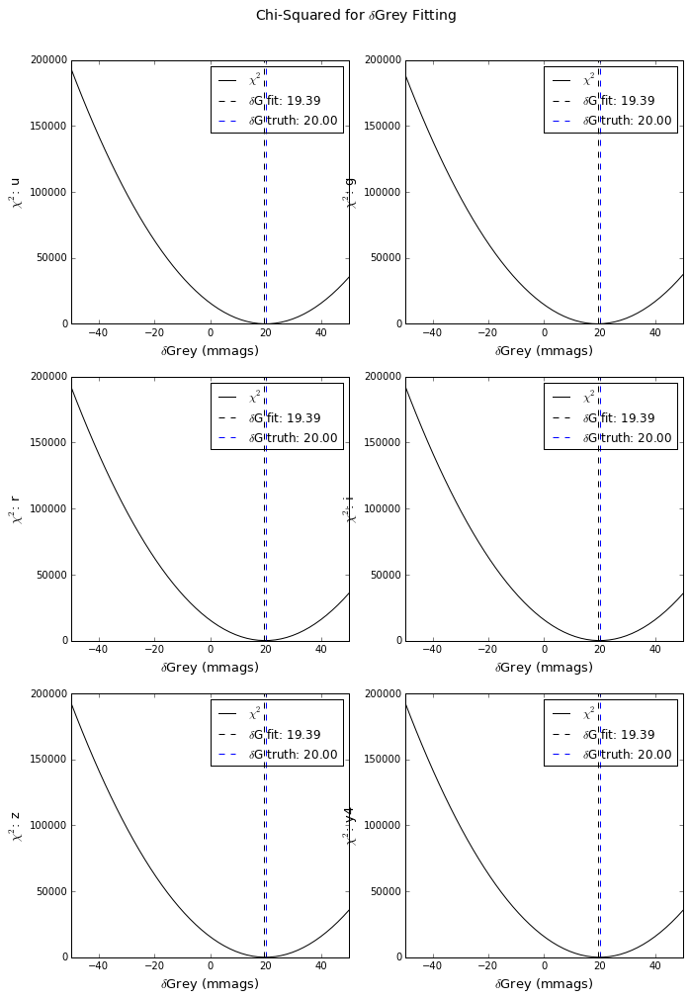

In [8]:
experimenter('O2','Aerosol','exp2')

## Experiment 3: $O_3$ and Aerosol

Computing nonlinear regression for O3 and Aerosol.
Observed atmosphere parameters: [1.0, 1.0, 5.0, 1.0, 5.0, 1.7]
Observed atmosphere airmass:    1.5
Standard atmosphere parameters: [1.0, 1.0, 1.0, 1.0, 1.0, 1.7]
Standard atmosphere airmass:    1.2
Observed atmosphere parameter for O3: 5.0
Observed atmosphere parameter for Aerosol: 5.0

Fitting for O3 between 0.20 and 5.00 in 25 bins.
Fitting for Aerosol between 0.20 and 5.00 in 25 bins.

Non-zero deltaGrey detected.
Fitting for deltaGrey between -50.00 and 50.00 mmags in 50 bins.

Regressing 31250 parameter combinations per filter...

Calculating best fit parameters for u filter...
@pickle_results: using precomputed results from 'pickles/X15_P101050105017_O3_Aerosol_XSTD12_DG200_DGR-5050_E5_mss_u_50dgb_25b_exp3.pkl'
Saved LogL at best fit deltaGrey for u filter.
Saved Chi-Squared at best fit deltaGrey for u filter.
Completed u filter.

Calculating best fit parameters for g filter...
@pickle_results: using precomputed results from 'pic

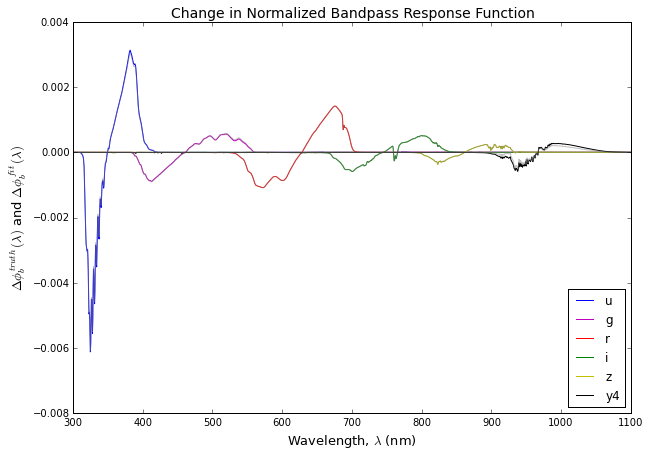

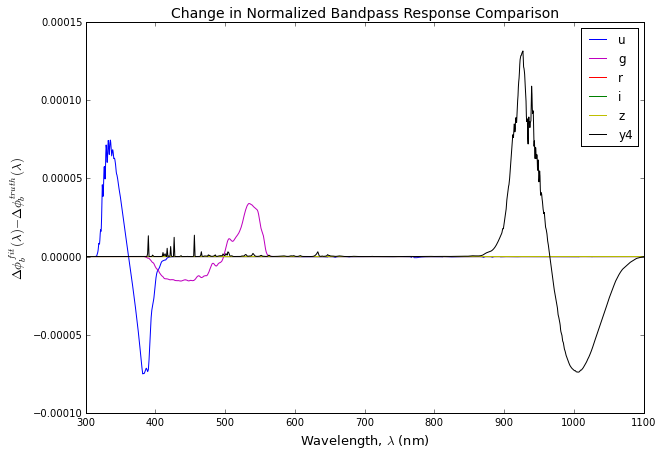

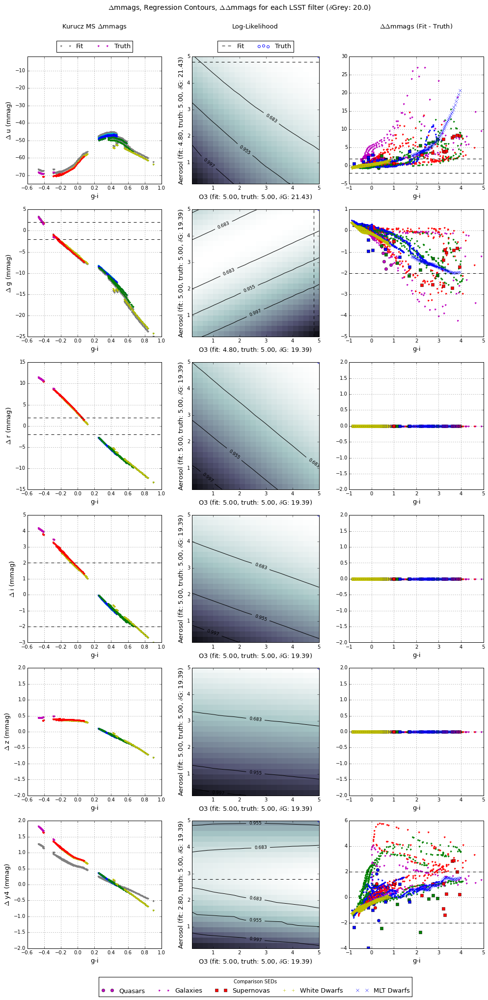

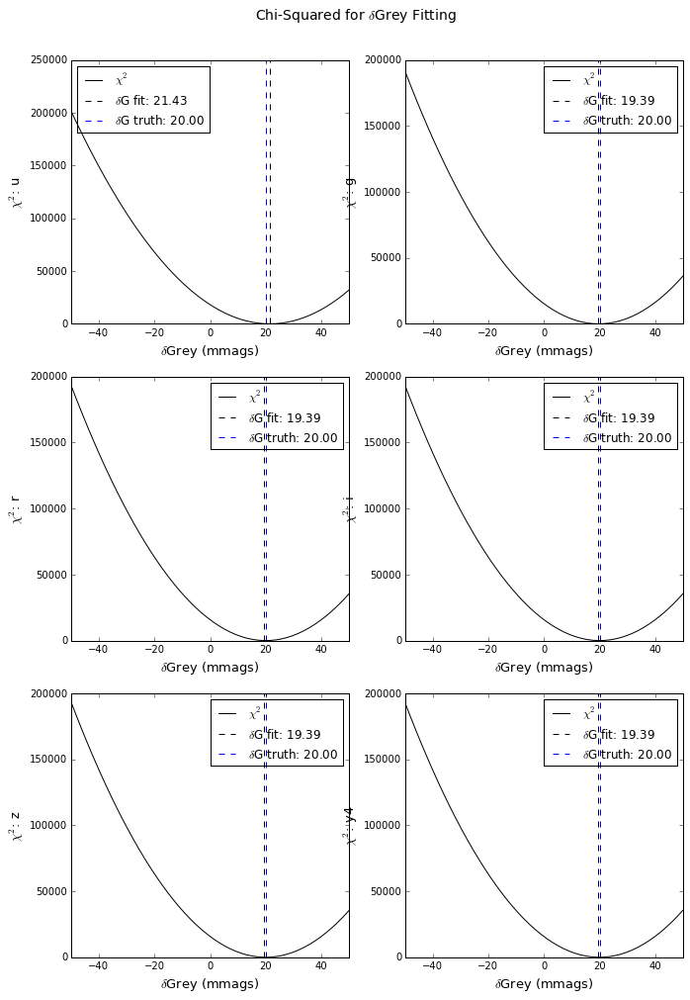

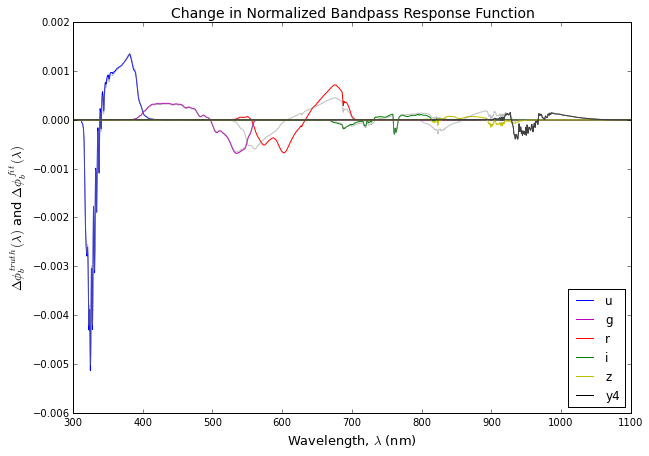

...

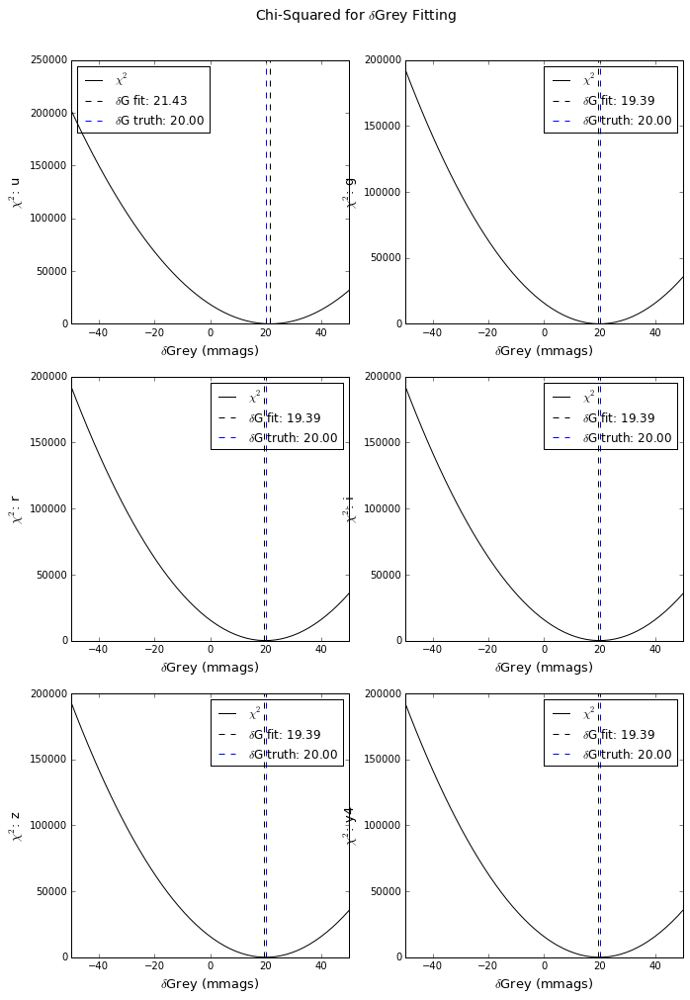

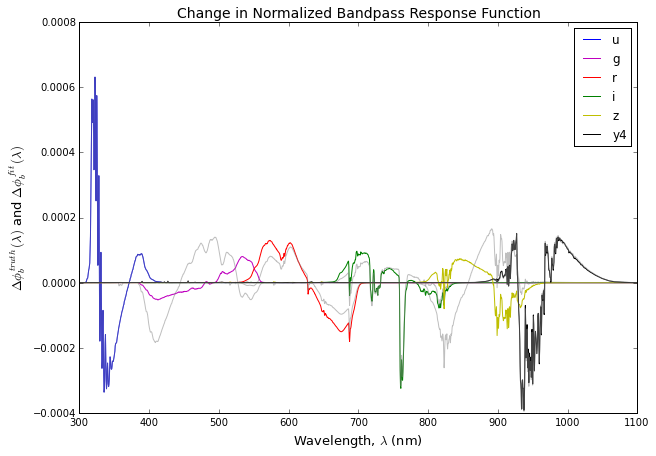

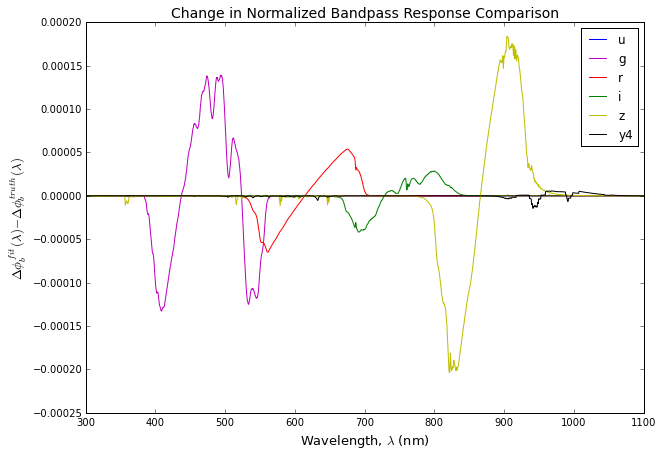

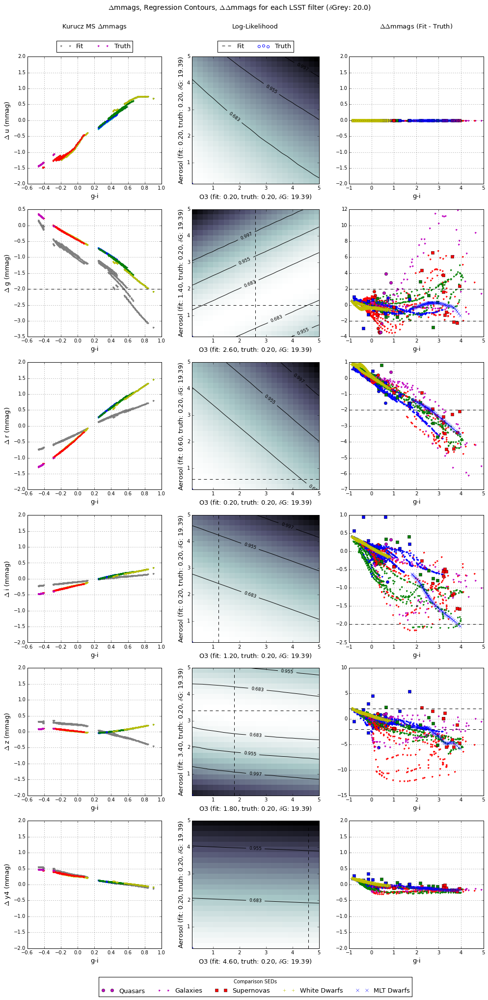

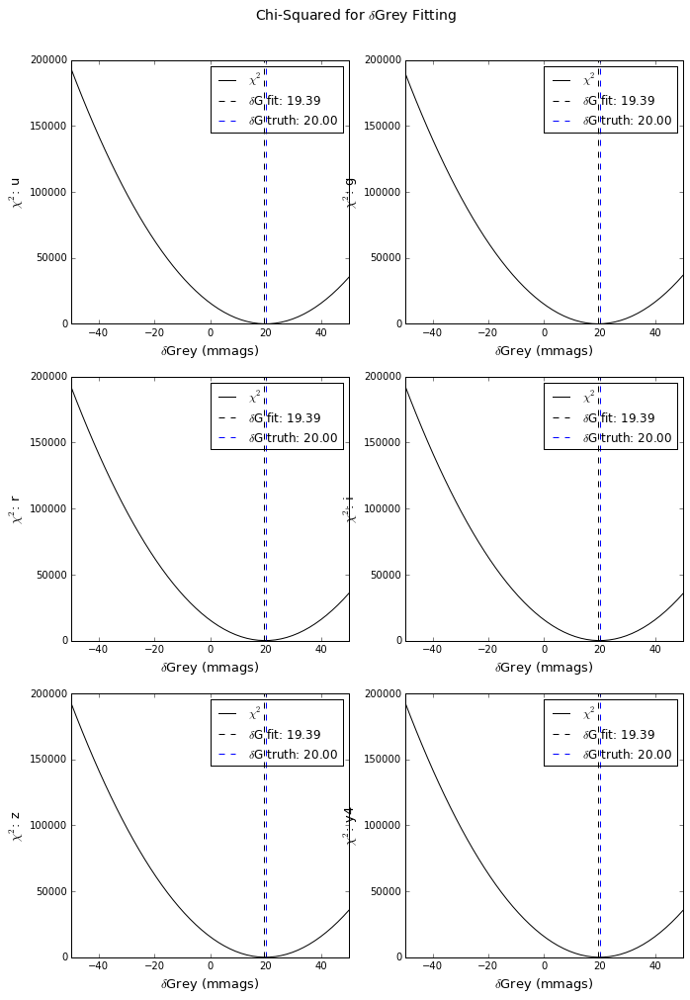

In [9]:
experimenter('O3','Aerosol','exp3')

## Experiment 4: $O_2$ and Rayleigh

Computing nonlinear regression for O2 and Rayleigh.
Observed atmosphere parameters: [1.0, 5.0, 1.0, 5.0, 1.0, 1.7]
Observed atmosphere airmass:    1.5
Standard atmosphere parameters: [1.0, 1.0, 1.0, 1.0, 1.0, 1.7]
Standard atmosphere airmass:    1.2
Observed atmosphere parameter for O2: 5.0
Observed atmosphere parameter for Rayleigh: 5.0

Fitting for O2 between 0.20 and 5.00 in 25 bins.
Fitting for Rayleigh between 0.20 and 5.00 in 25 bins.

Non-zero deltaGrey detected.
Fitting for deltaGrey between -50.00 and 50.00 mmags in 50 bins.

Regressing 31250 parameter combinations per filter...

Calculating best fit parameters for u filter...
@pickle_results: using precomputed results from 'pickles/X15_P105010501017_O2_Rayleigh_XSTD12_DG200_DGR-5050_E5_mss_u_50dgb_25b_exp4.pkl'
Saved LogL at best fit deltaGrey for u filter.
Saved Chi-Squared at best fit deltaGrey for u filter.
Completed u filter.

Calculating best fit parameters for g filter...
@pickle_results: using precomputed results from 

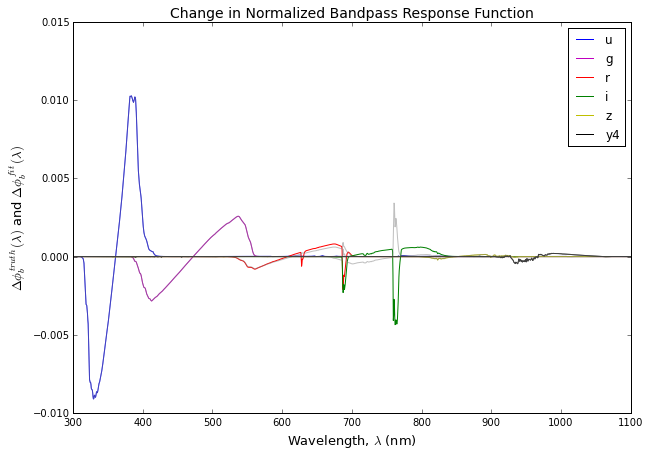

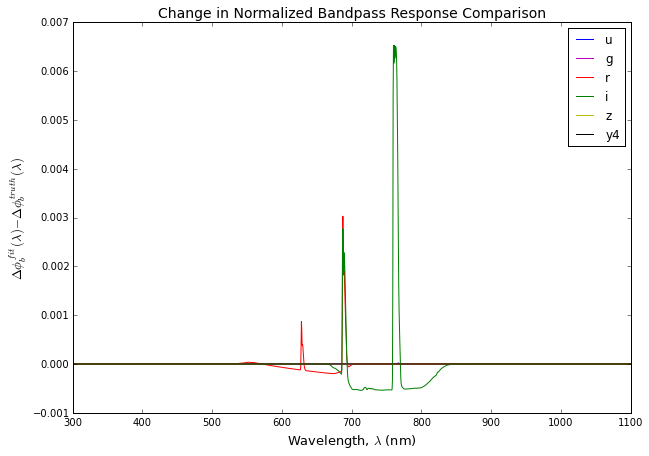

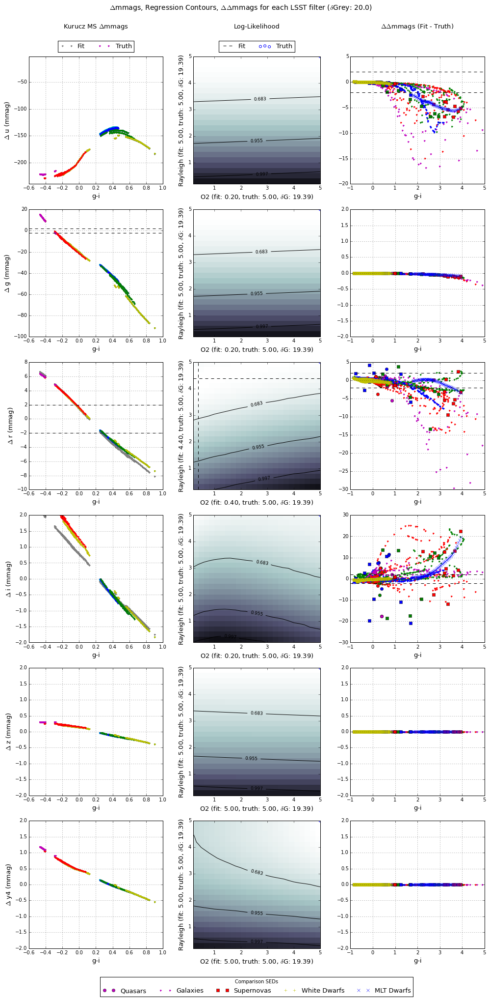

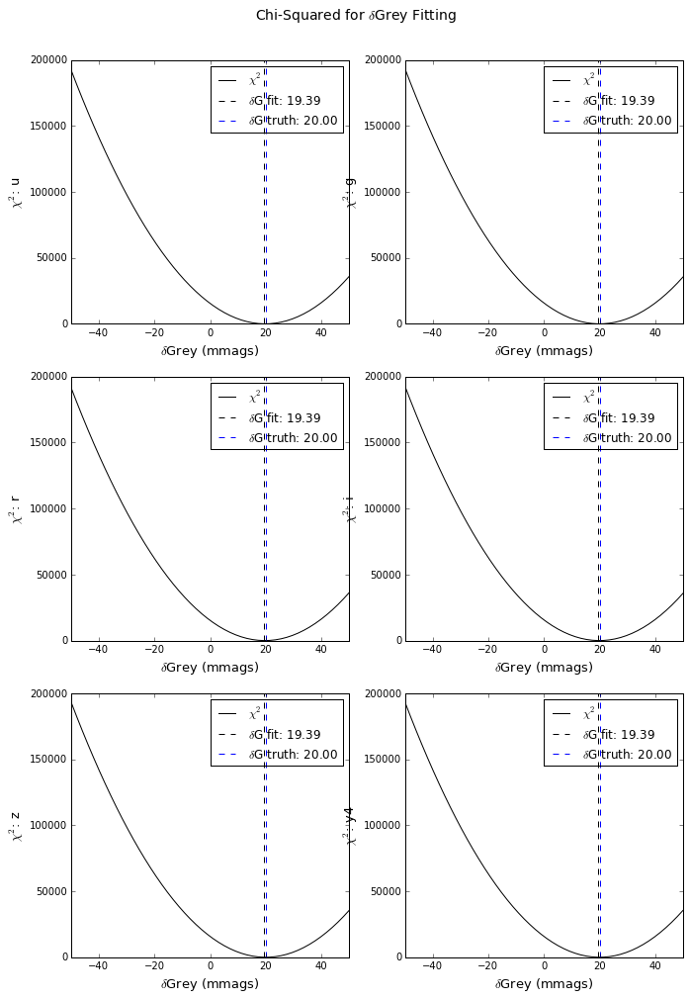

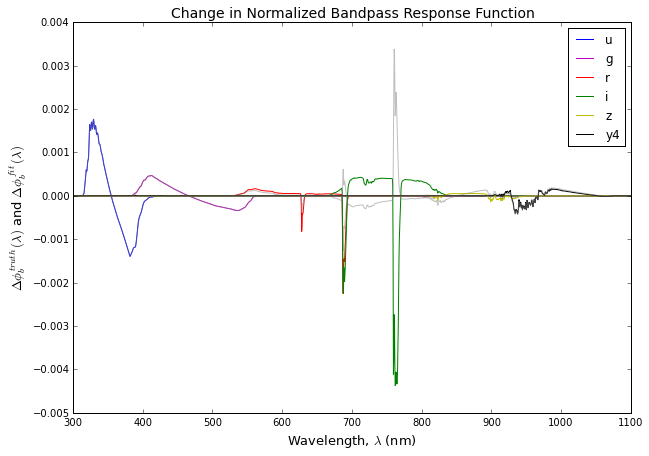

...

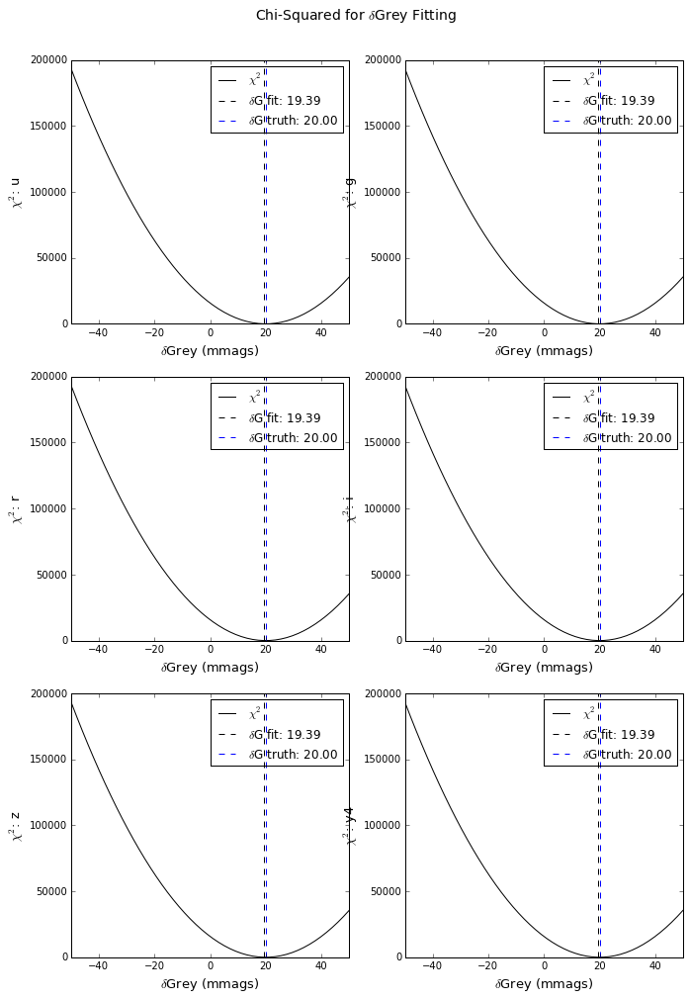

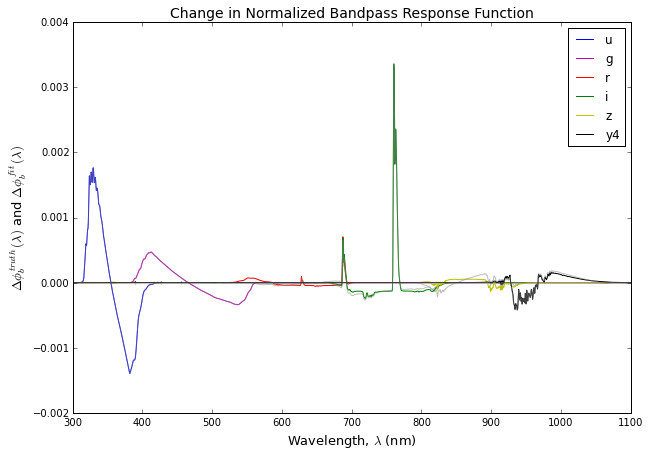

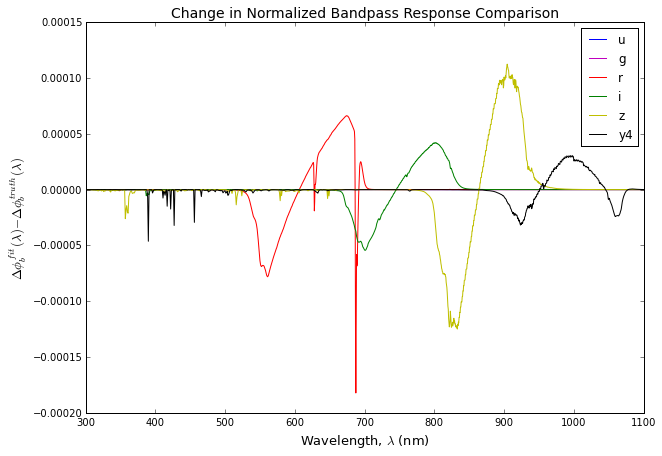

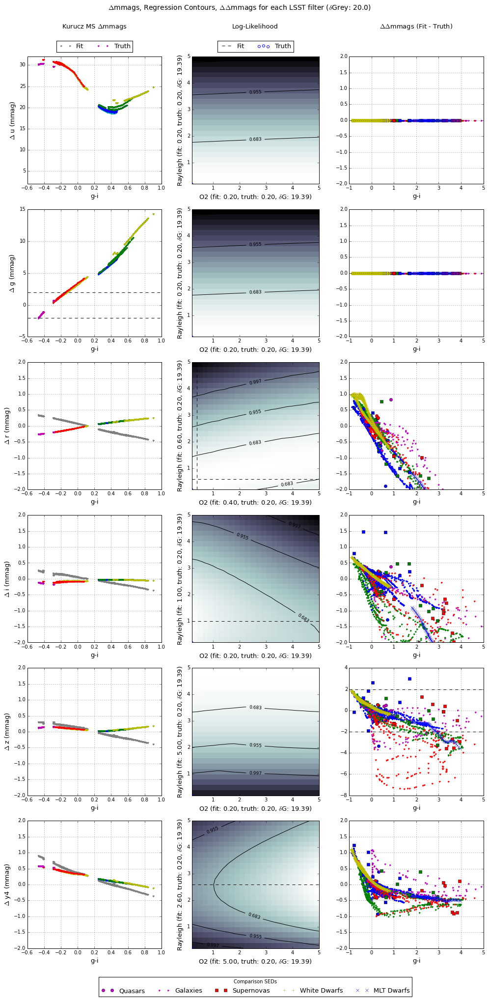

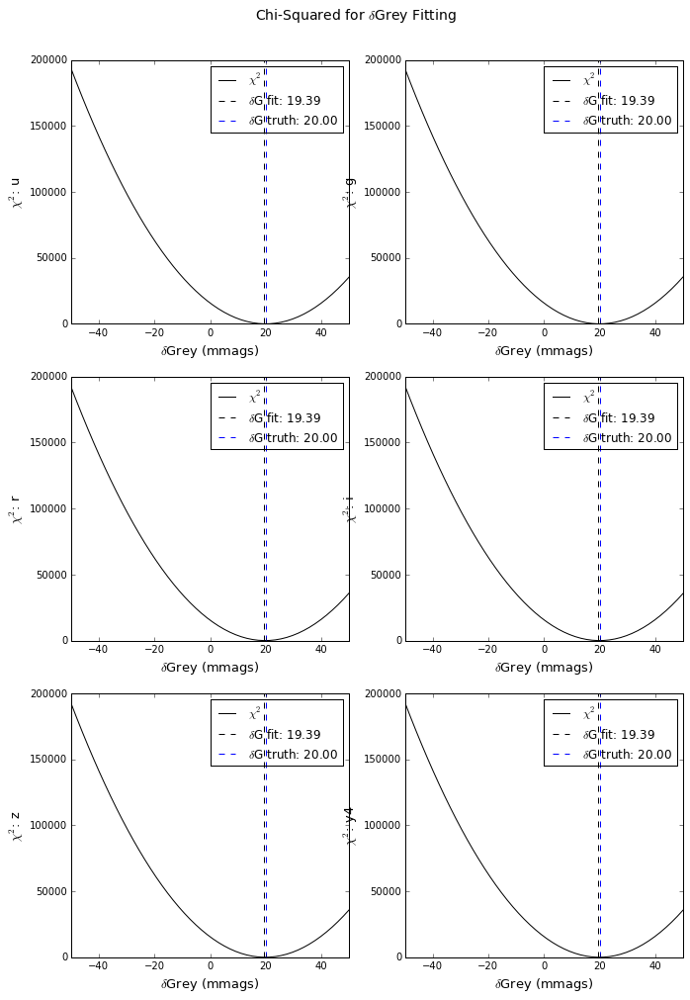

In [10]:
experimenter('O2','Rayleigh','exp4')

## Experiment 5: $O_3$ and Rayleigh

Computing nonlinear regression for O3 and Rayleigh.
Observed atmosphere parameters: [1.0, 1.0, 5.0, 5.0, 1.0, 1.7]
Observed atmosphere airmass:    1.5
Standard atmosphere parameters: [1.0, 1.0, 1.0, 1.0, 1.0, 1.7]
Standard atmosphere airmass:    1.2
Observed atmosphere parameter for O3: 5.0
Observed atmosphere parameter for Rayleigh: 5.0

Fitting for O3 between 0.20 and 5.00 in 25 bins.
Fitting for Rayleigh between 0.20 and 5.00 in 25 bins.

Non-zero deltaGrey detected.
Fitting for deltaGrey between -50.00 and 50.00 mmags in 50 bins.

Regressing 31250 parameter combinations per filter...

Calculating best fit parameters for u filter...
@pickle_results: using precomputed results from 'pickles/X15_P101050501017_O3_Rayleigh_XSTD12_DG200_DGR-5050_E5_mss_u_50dgb_25b_exp5.pkl'
Saved LogL at best fit deltaGrey for u filter.
Saved Chi-Squared at best fit deltaGrey for u filter.
Completed u filter.

Calculating best fit parameters for g filter...
@pickle_results: using precomputed results from 

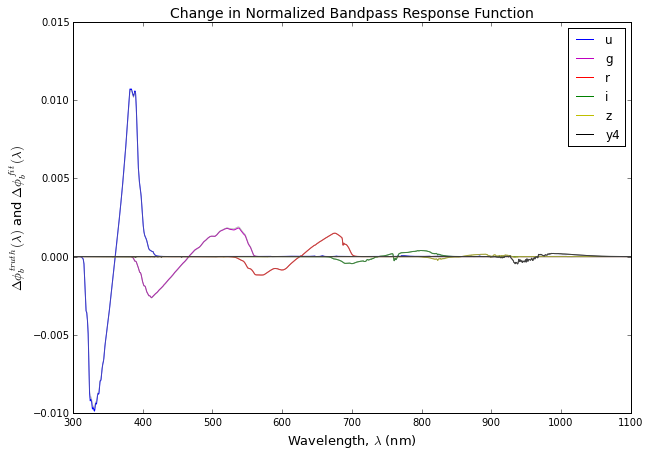

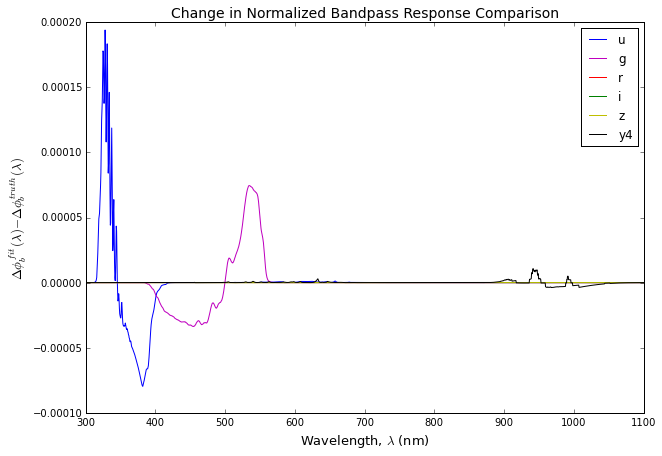

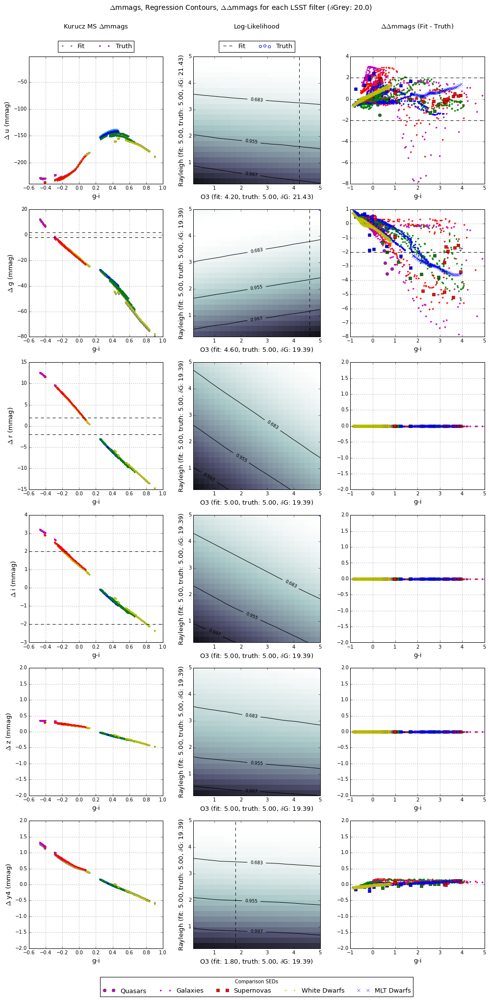

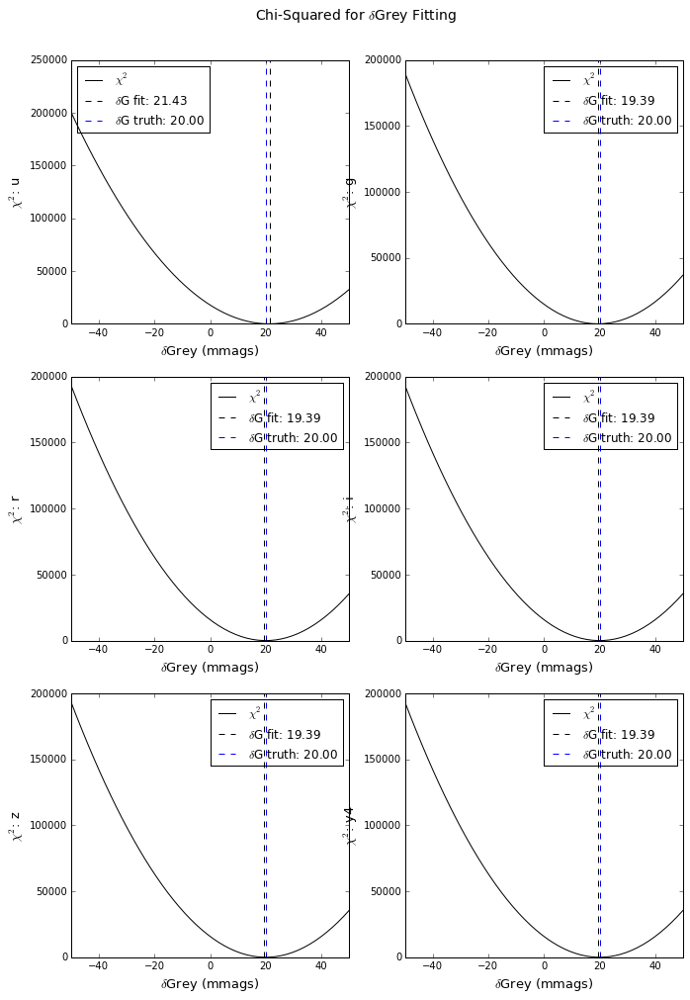

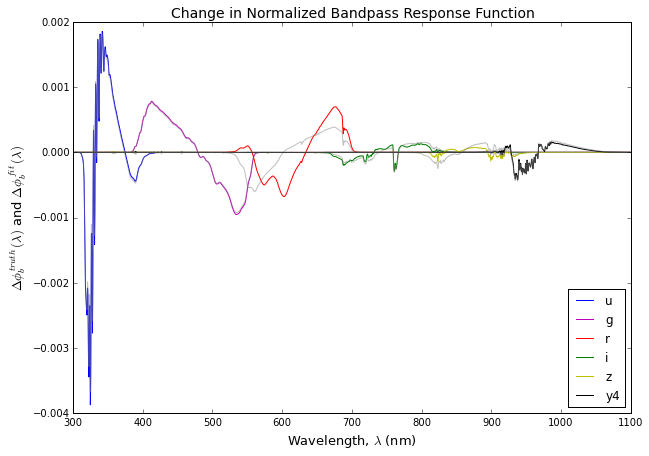

...

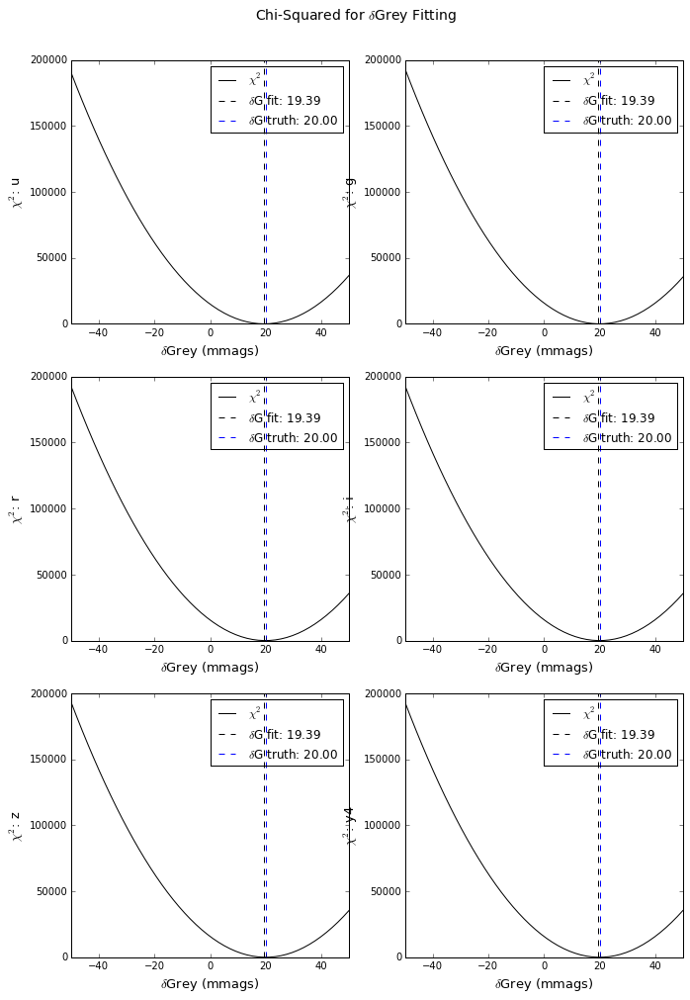

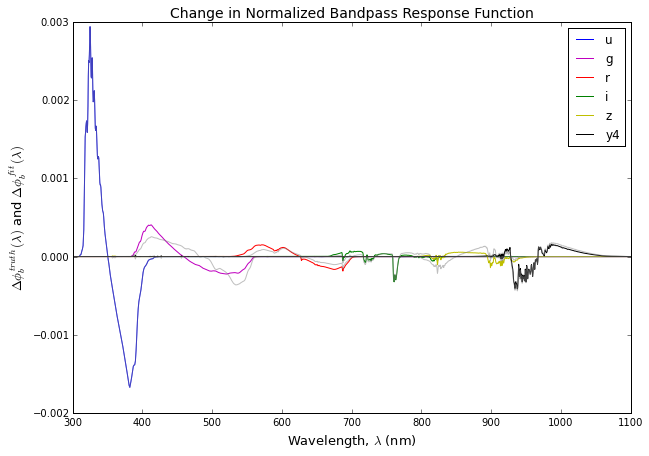

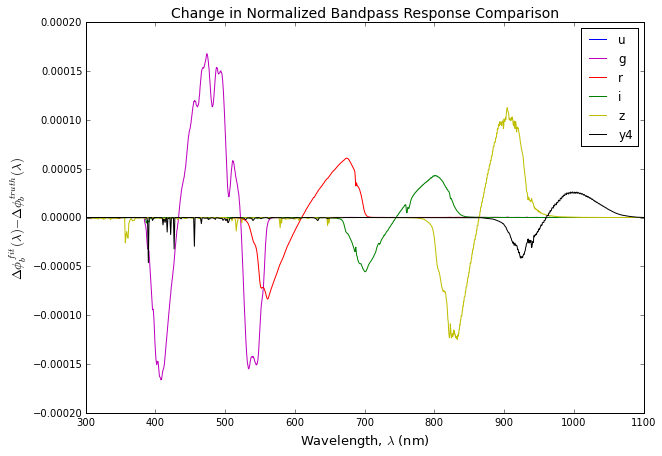

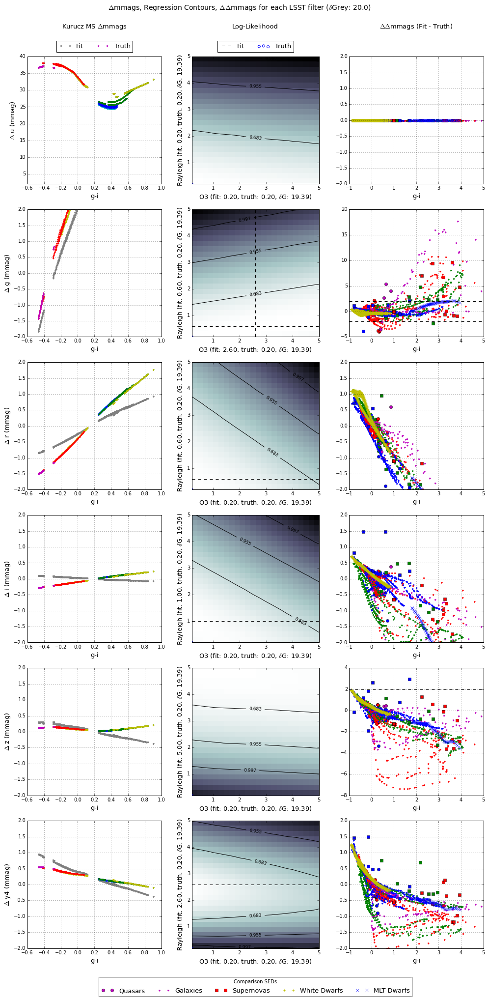

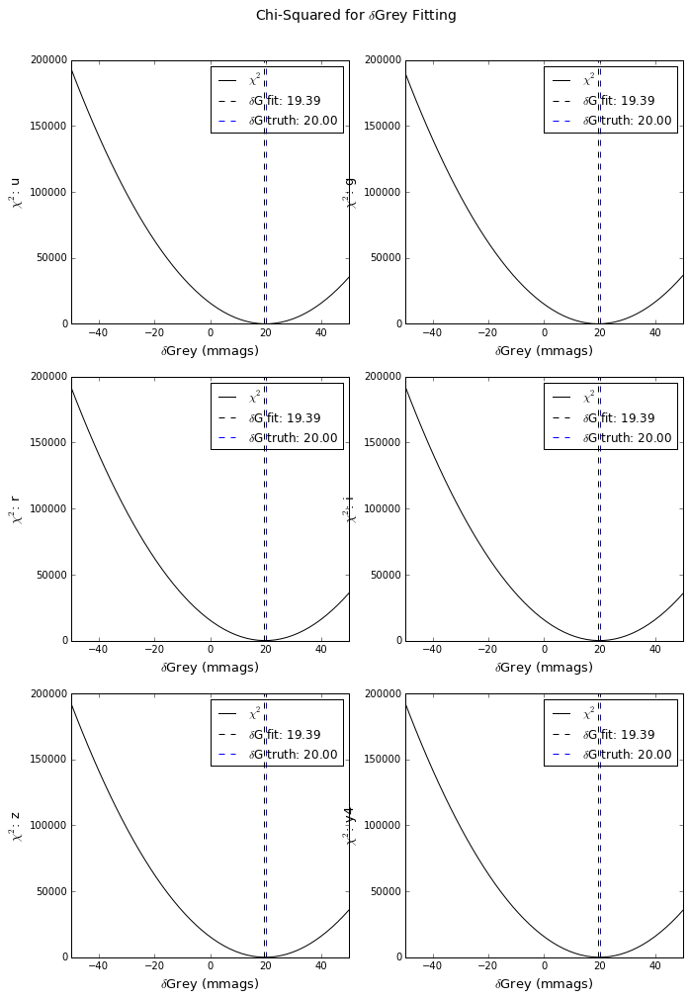

In [11]:
experimenter('O3','Rayleigh','exp5')

## Experiment 6: Aerosol and Alpha

Computing nonlinear regression for Aerosol and Alpha.
Observed atmosphere parameters: [1.0, 1.0, 1.0, 1.0, 5.0, 5.0]
Observed atmosphere airmass:    1.5
Standard atmosphere parameters: [1.0, 1.0, 1.0, 1.0, 1.0, 1.7]
Standard atmosphere airmass:    1.2
Observed atmosphere parameter for Aerosol: 5.0
Observed atmosphere parameter for Alpha: 5.0

Fitting for Aerosol between 0.20 and 5.00 in 25 bins.
Fitting for Alpha between 0.20 and 5.00 in 25 bins.

Non-zero deltaGrey detected.
Fitting for deltaGrey between -50.00 and 50.00 mmags in 50 bins.

Regressing 31250 parameter combinations per filter...

Calculating best fit parameters for u filter...
@pickle_results: using precomputed results from 'pickles/X15_P101010105050_Aerosol_Alpha_XSTD12_DG200_DGR-5050_E5_mss_u_50dgb_25b_exp6.pkl'
Saved LogL at best fit deltaGrey for u filter.
Saved Chi-Squared at best fit deltaGrey for u filter.
Completed u filter.

Calculating best fit parameters for g filter...
@pickle_results: using precomputed resul

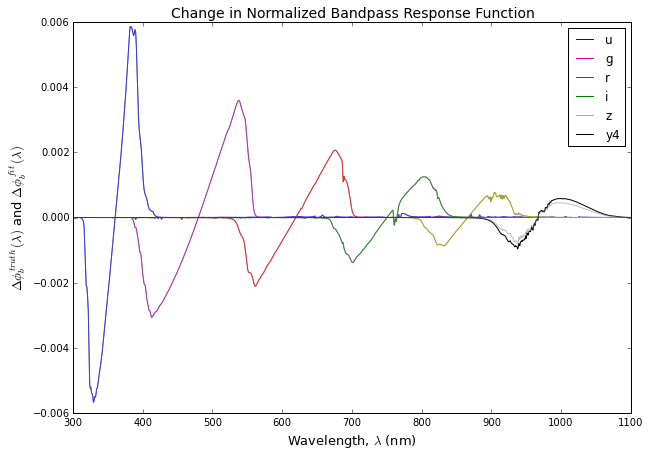

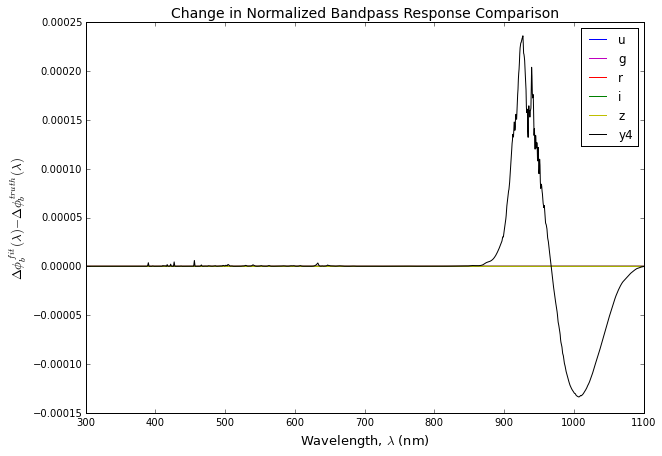

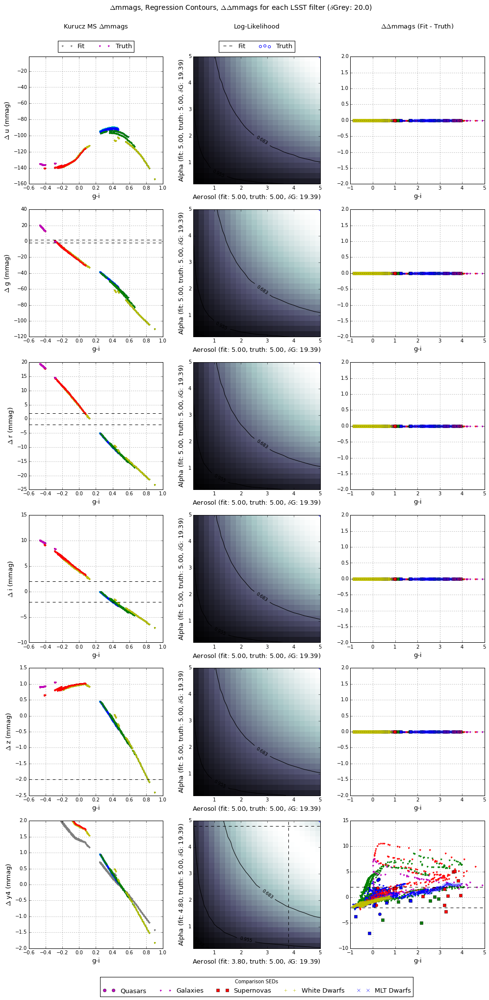

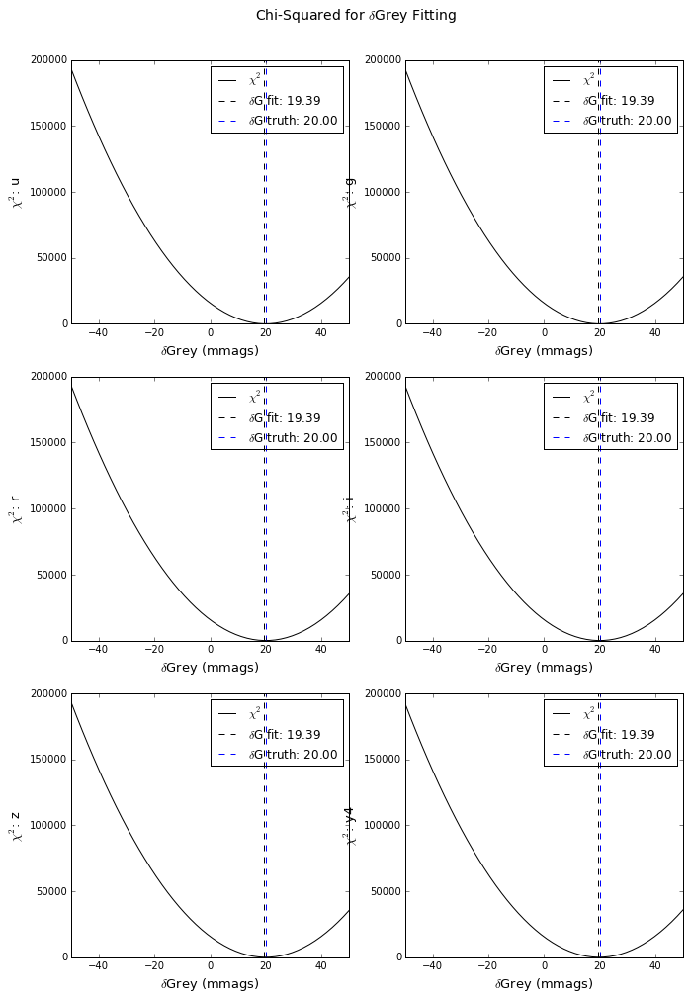

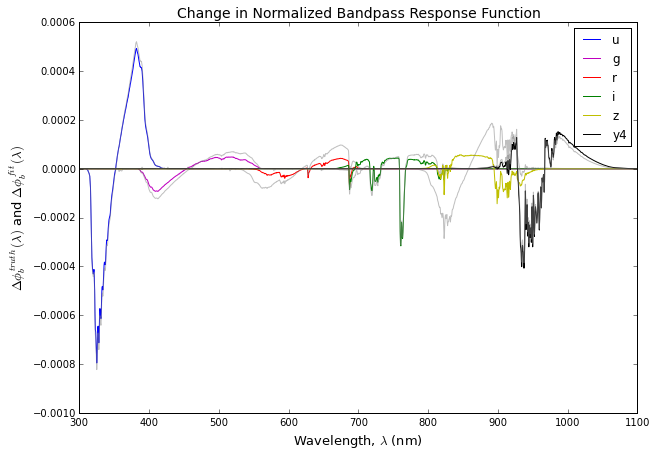

...

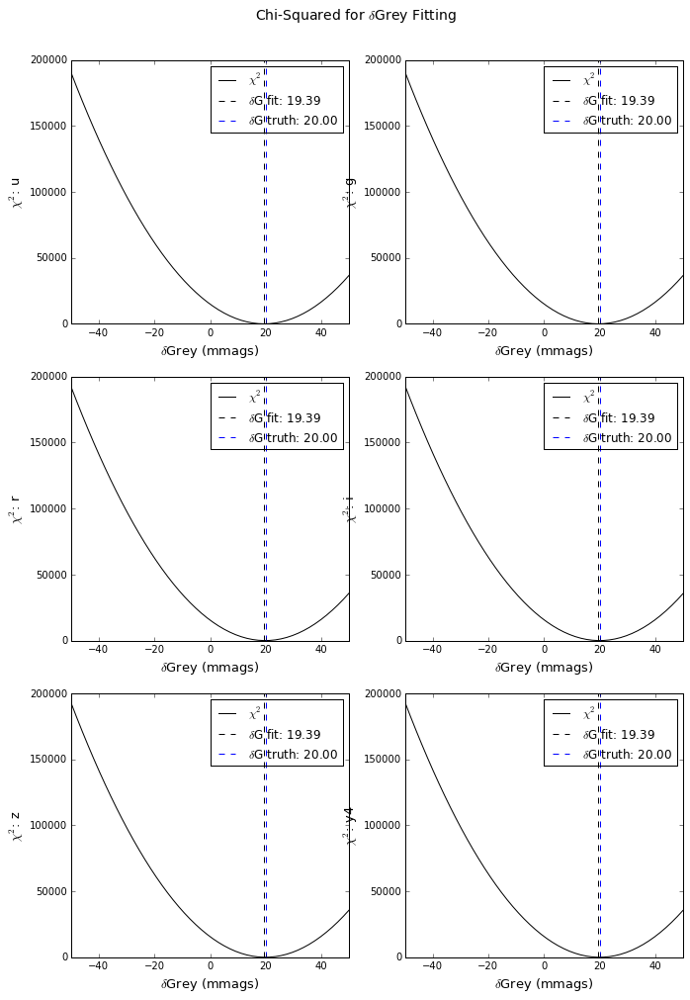

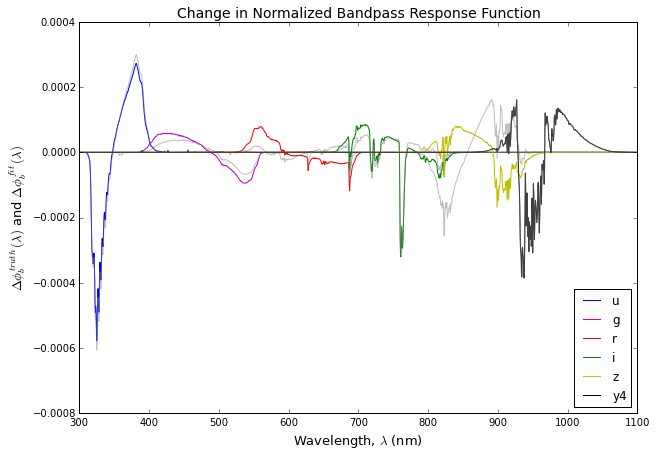

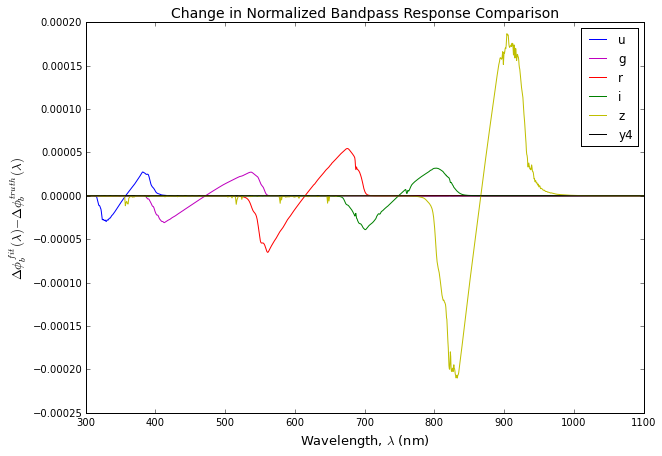

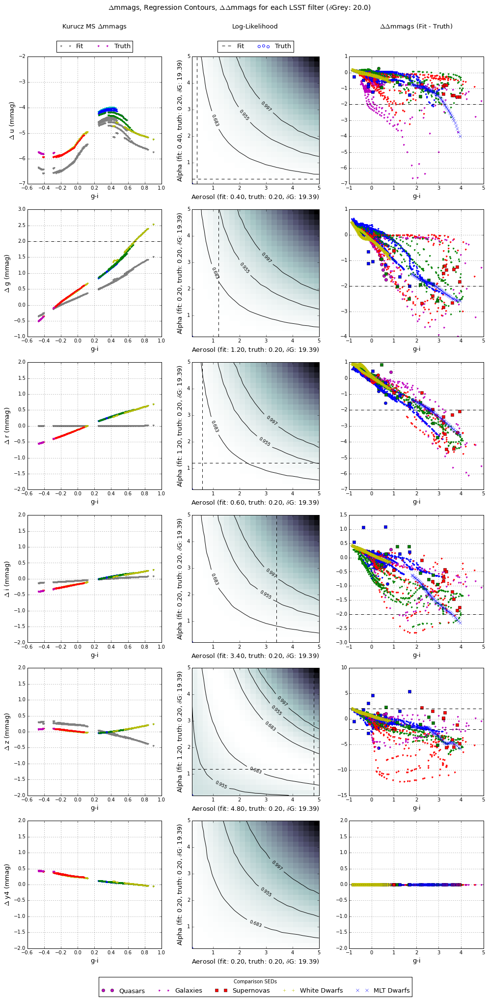

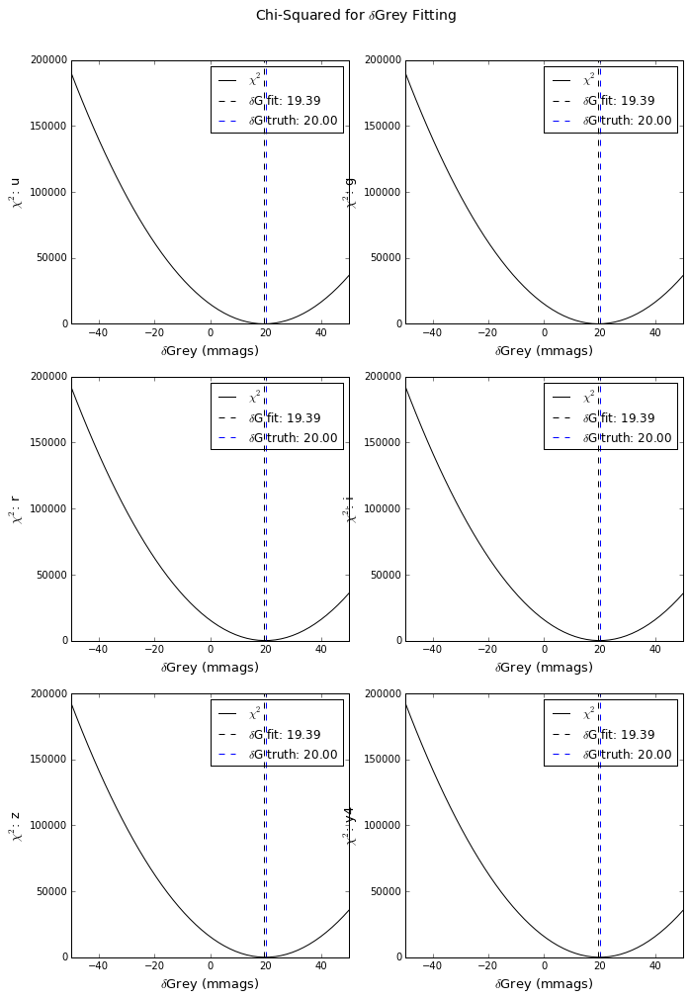

In [12]:
experimenter('Aerosol','Alpha','exp6')